In [19]:
library("here")
library(devtools)
library(Seurat)
library(harmony)
library(RcppML)
library(reshape2)
library(tidyverse)
load_all('/home/jpm73279/Socrates')
data_path <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/zea_mays/QC_output/"

set.seed(12345)


library(cowplot)
library(randomcoloR)
library(dplyr)
options(repr.plot.width=15, repr.plot.height=15)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)


here() starts at /home/jpm73279/Mendieta_et_al_comparative_single_cell

Loading required package: usethis

Attaching SeuratObject

Attaching sp

Loading required package: Rcpp


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths


ℹ Loading Socrates
Loading required package: cicero

Loading required package: monocle

Loading required package: Matrix


Attaching package: 'Matrix'


The following objects are masked from 'package:tidyr':

    expand, pack, unpack


Loading required package: Biobase

Loading required package: BiocGenerics


Attaching package: 'BiocGenerics'


The following objects are masked from 'package:dplyr':

    combine, intersect, setdiff, union


The following objects are masked from 'package:stats':

    IQR, mad, sd, var, xtabs


The following objects are masked from 'package:base':

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, g

In [20]:
library("here")
library(devtools)
library(Seurat)
library(harmony)
library(RcppML)
library(reshape2)
library(tidyverse)
load_all('/home/jpm73279/Socrates')
data_path <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/sorghum_bicolor/QC_output/"

set.seed(12345)



library("presto")
run_presto <- function(meta_obj, 
                       meta_slot = "Clusters", 
                       cluster_name = "LouvainClusters", 
                       counts_raw="acr_counts_raw"){
    ### Pull the correct meta datafrom the Socrates Object
    sparse_matrix <- meta_obj[[counts_raw]]
    meta_data <- meta_obj[[meta_slot]]
    
    print(head(as_tibble(meta_data)))
        
    ### Read the Giant Sparse Matrix
    loaded_sparse_matric <- read_delim(sparse_matrix, delim='\t', 
                                       col_names = c("gene_name", "barcode", "accessability"), 
                                       col_types = "ccn")
    
    print(head(loaded_sparse_matric))
    combined_large_w_sparse <- loaded_sparse_matric  %>% 
        filter(gene_name != "Annotation")  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        left_join(., meta_data, by = c("barcode" = "cellID"))  %>% 
        filter(is.na(!!sym(cluster_name)) != TRUE)  %>% 
        arrange(!!sym(cluster_name))
    
    #order <- combined_large_w_sparse[!!sym(cluster_name)]

    combined_large_w_sparse <- combined_large_w_sparse  %>% 
        dplyr::select(gene_name, barcode, accessability)  %>% 
        mutate(across(accessability, as.numeric))
    
    
    gene_names <- unique(combined_large_w_sparse$gene_name)
    barcodes <- unique(combined_large_w_sparse$barcode)

    combined_large_w_sparse$row <- match(combined_large_w_sparse$gene_name, gene_names)
    combined_large_w_sparse$col <- match(combined_large_w_sparse$barcode, barcodes)


    UIMatrix <- sparseMatrix(i = combined_large_w_sparse$row,
                         j = combined_large_w_sparse$col,
                         x = combined_large_w_sparse$accessability,
                         dimnames=list(gene_names, barcodes))

    print(head(tibble(barcode = unlist(UIMatrix@Dimnames[2]))))
    barcode_tibble <- tibble(barcode = unlist(UIMatrix@Dimnames[2])) %>% 
        left_join(., as_tibble(meta_data), by = c("barcode" = "cellID"))  %>% 
        filter(is.na(total) != TRUE)
    
    print(dim(barcode_tibble))
    print(dim(UIMatrix))
    
    clust_name <- c(cluster_name)
    garbbed_louv_order <- pull(barcode_tibble,!!sym(clust_name))

    sparse_matrix_test <- wilcoxauc(UIMatrix, garbbed_louv_order)
    
    meta_obj[["presto_marker"]] <- sparse_matrix_test
    
    return(meta_obj)
}

ℹ Loading Socrates
Warning message:
"replacing previous import 'scales::viridis_pal' by 'viridis::viridis_pal' when loading 'Socrates'"
Loading required package: data.table


Attaching package: 'data.table'


The following object is masked from 'package:slam':

    rollup


The following object is masked from 'package:GenomicRanges':

    shift


The following object is masked from 'package:IRanges':

    shift


The following objects are masked from 'package:S4Vectors':

    first, second


The following objects are masked from 'package:reshape2':

    dcast, melt


The following objects are masked from 'package:dplyr':

    between, first, last


The following object is masked from 'package:purrr':

    transpose




In [21]:
library(edgeR)
library(preprocessCore)
devtools::load_all('/home/jpm73279/software/preprocessCore')
library("edgeR")

marker_correlation <- function(meta_obj, 
                       meta_slot = "Clusters", 
                       cluster_name = "LouvainClusters", 
                       counts_raw="acr_counts_raw"){
   
    
    ### Pull the correct meta datafrom the Socrates Object
    sparse_matrix <- meta_obj[[counts_raw]]
    meta_data <- meta_obj[[meta_slot]]
    
    print(head(as_tibble(meta_data)))
        
    
    raw_cpm_counts_all_genes <- read_delim(sparse_matrix, delim="\t", col_names = c("gene_name", "barcode", "accessability")) %>%
        dplyr::mutate(cellID = barcode)  %>%
        dplyr::mutate(geneID = gene_name)

    merged_meta_cpm_information <- left_join(meta_data, raw_cpm_counts_all_genes, by = c("cellID"))  %>%
    #mutate(safe_cluster_name = str_c("Louvain_C", LouvainClusters, sep ="_"))  %>%
    #dplyr::select(-LouvainClusters)  %>%
        group_by(!!sym(cluster_name), geneID)  %>%
        summarise(counts = sum(accessability, na.rm = TRUE))

    ### Alt CPM Calc
    merged_meta_cpm_information_copied <- merged_meta_cpm_information
    catch <- merged_meta_cpm_information_copied  %>%
        group_by(!!sym(cluster_name)) %>%
        group_map(~(cpm(.x$counts, log = FALSE, group = .f)), .keep = TRUE)  %>%
        unlist()



    caught_values <- as_tibble(catch)

    see <- ungroup(merged_meta_cpm_information_copied)
    idk <- bind_cols(merged_meta_cpm_information_copied,caught_values)  
    print(head(idk))
    
    merged_meta_cpm_information_copied<- bind_cols(merged_meta_cpm_information_copied,caught_values)  %>% 
        ungroup()  %>% 
        dplyr::rename(grouped_CPM = value)  %>% 
        dplyr::group_by(!!sym(cluster_name)) %>%  
        dplyr::mutate(log_cpm  = log(grouped_CPM))


    #Apply quantile normalization
    merged_meta.quant_norm <- merged_meta_cpm_information_copied  %>% 
        group_by(!!sym(cluster_name))  %>% 
        group_map(~(preprocessCore::normalize.quantiles(data.matrix(.x$grouped_CPM), copy = FALSE)), .keep = TRUE)  %>% 
        unlist()

    zm.quantile_normalized <- as_tibble(merged_meta.quant_norm)  %>% 
        dplyr::rename("quant_norm_cpm" = value)


    merged_meta_cpm_information_copied <- bind_cols(merged_meta_cpm_information_copied, zm.quantile_normalized)

    cell_type_accessability <- merged_meta_cpm_information_copied  %>% 
        dplyr::ungroup()  %>% 
        dplyr::select(!!sym(cluster_name), geneID, quant_norm_cpm)  %>% 
        pivot_wider(names_from = !!sym(cluster_name), values_from = quant_norm_cpm, values_fill = 0)
    


    
    meta_obj[["corr_matrix"]] <- cell_type_accessability
    
    return(meta_obj)
}


Loading required package: limma


Attaching package: 'limma'


The following object is masked from 'package:BiocGenerics':

    plotMA


ℹ Loading preprocessCore


In [22]:

marker_list_maize_file <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/markers/Zm.markers.leaf.txt"
marker_list_maize <- read_delim(marker_list_maize_file, delim='\t', 
                                       col_names = TRUE)

loaded_socrates_data <- readRDS("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/zea_mays/clustering/Zm_leaf.updated_QC_2.annot.V4.soc_obj.rds")

Rows: 188 Columns: 7
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (5): chr, geneID, name, type, tissue
dbl (2): start, end

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [5]:

# bed <- system.file("extdata", "test.tn5.bed.gz", package = "Socrates")
#ann <- system.file("extdata", "gencode.v19.annotation.gff3.gz", package = "Socrates")
#chr <- system.file("extdata", "hg19.txt", package = "Socrates")

reference_genome_path <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/"
#analysis_path <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/"
ann <- paste0(reference_genome_path,"Zm-B73-REFERENCE-NAM-5.0_Zm00001eb.1.gff3")
chr <- paste0(reference_genome_path,"Zm-B73-REFERENCE-NAM-5.0.chrom.size")
bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm_merged_repliates.unique.mpq10.tn5.sorted.bed"


#Load Object
Zm.subcluster <- loadBEDandGenomeData(bed_intersections, ann, chr)
#zea_m.rep.peaks  <- paste0(pre, "macs2_temp", sep=".")


Running pre-check on input files and executable paths ...

BED file path = /scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm_merged_repliates.unique.mpq10.tn5.sorted.bed ... ok

GFF file path = /home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM-5.0_Zm00001eb.1.gff3 ... ok

Chromosome sizes file path = /home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM-5.0.chrom.size ... ok

Macs2 is installed .... ok

 - loading data (this may take obj while for big BED files) ...

 - finished loading data



In [4]:
colnames(loaded_socrates_data$Clusters)

loaded_socrates_data$Clusters  %>% 
    group_by(LouvainClusters)  %>% 
    summarise(n())
    

[1] "cellID"          "total"           "tss"             "acrs"           
 [5] "ptmt"            "nSites"          "log10nSites"     "pTSS"           
 [9] "FRiP"            "pOrg"            "tss_z"           "acr_z"          
[13] "sites_z"         "qc_check"        "background"      "cellbulk"       
[17] "is_cell"         "sampleID"        "umap1"           "umap2"          
[21] "doubletscore"    "d.type"          "ptmt_ratio"      "LouvainClusters"

LouvainClusters,n()
<fct>,<int>
1,2880
2,2477
3,2053
4,1596
5,1186
6,1134
7,1097
8,1118
9,906


In [5]:
v3.annot <- read.table("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_leaf.V3_final.txt", header = TRUE)  %>% 
    dplyr::select(cellID, V3_final_annnotation)

In [6]:
updated_meta_data <- left_join(loaded_socrates_data$Clusters, v3.annot, by = "cellID")

In [7]:
Zm.subcluster <- Zm.subcluster
Zm.subcluster$meta <- updated_meta_data

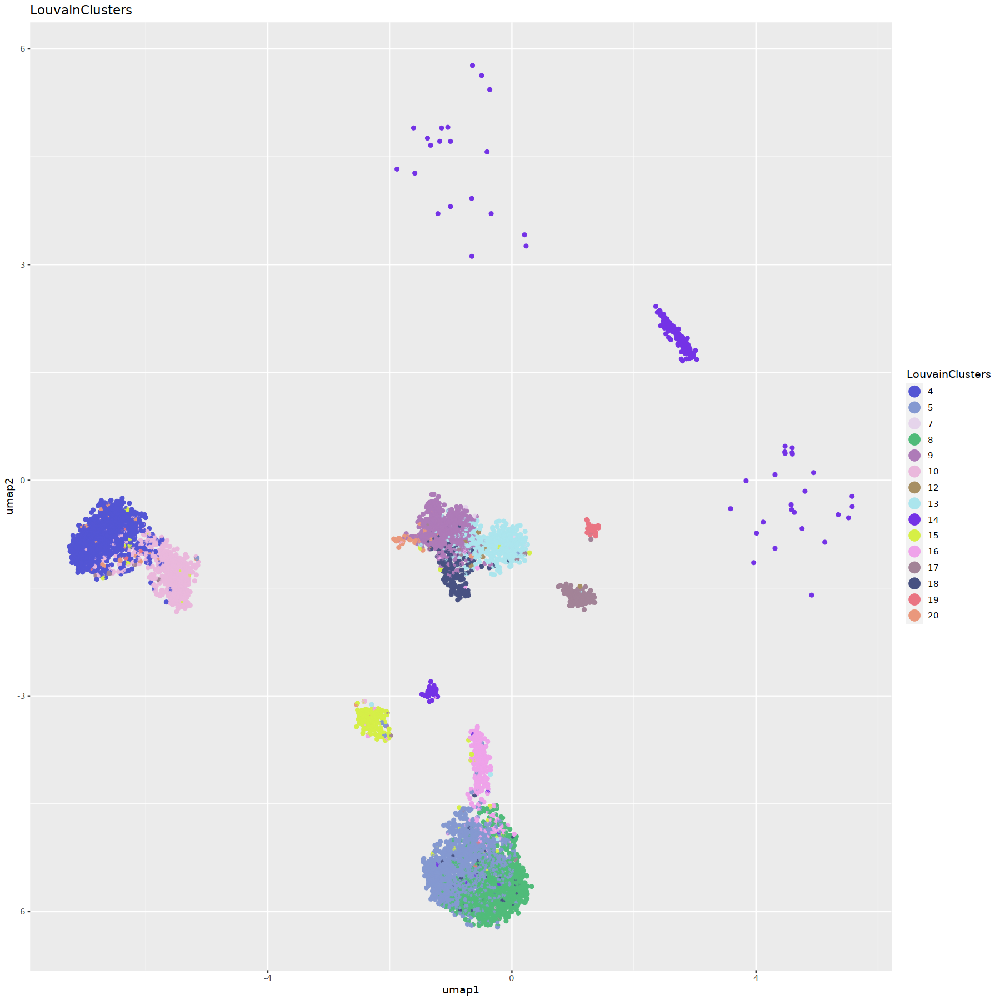

In [8]:
Zm.subcluster.vasculature <- Zm.subcluster
Zm.subcluster.vasculature$meta  %>% 
    dplyr::filter((umap1 < 2 & umap2 < 0) | LouvainClusters == "14" )  %>% 
    ggplot(., aes(umap1, umap2, color = LouvainClusters)) + geom_point() +
 scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("LouvainClusters")

chosen_subcluster <- Zm.subcluster.vasculature$meta %>% 
    dplyr::filter((umap1 < 2 & umap2 < 0) | LouvainClusters == "14" )

In [9]:
meta_df <- as.data.frame(chosen_subcluster)
rownames(meta_df) <- meta_df$cellID
Zm.subcluster.vasculature$meta <- meta_df
Zm.subcluster.vasculature$meta.v3 <- meta_df

In [10]:
Zm.subcluster.vasculature <- generateMatrix(Zm.subcluster.vasculature, 
                                              filtered=FALSE,
                                              peaks = FALSE,
                                              organelle_scaffolds= c("Pt", "Mt"),
                                                blacklist = "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/black_list_sc_ATAC/Zm.final_blaclist.final.bed",
                                              verbose=TRUE)

Zm.subcluster.vasculature <- convertSparseData(Zm.subcluster.vasculature, verbose = TRUE)

 - converting triplet format to sparseMatrix



In [11]:
# clean sparse counts matrix ---------------------------------------------
Zm.subcluster_vasculature.clean <- cleanData(Zm.subcluster.vasculature, 
                     min.c = 20,
                     min.t=0.01,  # minimum feature frequency across cells
                     max.t=0.2, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 7935 | peaks = 2053210

   * Filtered: cells = 7913 | peaks = 27667



In [12]:
# normalize with TFIDF ---------------------------------------------------
Zm.subcluster_vasculature.clean <- tfidf(Zm.subcluster_vasculature.clean)

# project with NMF -------------------------------------------------------
Zm.subcluster_vasculature.clean <- reduceDims(Zm.subcluster_vasculature.clean,
                      method="SVD", 
                      n.pcs=50, 
                      num.var=8000,
                      doL2=TRUE,
                      svd_slotName="SVD")

# reduce to 2-dimensions with UMAP ---------------------------------------
Zm.subcluster_vasculature.clean <- projectUMAP(Zm.subcluster_vasculature.clean, 
                       verbose=T,
                       k.near=15,
                       m.dist=0.01,
                       svd_slotName="SVD")

library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

 - non-linear dimensionality reduction with UMAP ...

09:18:58 UMAP embedding parameters a = 1.896 b = 0.8006

09:18:58 Read 7913 rows and found 49 numeric columns

09:18:58 Using Annoy for neighbor search, n_neighbors = 15

09:18:58 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

09:18:59 Writing NN index file to temp file /tmp/Rtmp0jYWwM/file1921a37c3a1a9

09:18:59 Searching Annoy index using 16 threads, search_k = 1500

09:19:00 Annoy recall = 100%

09:19:06 Commencing smooth kNN distance calibration using 16 threads
 with target n_neighbors = 15

09:19:10 Initializing from normalized Laplacian + noise (using irlba)

09:19:10 Commencing optimization for 500 epochs, with 163518 positive edges

09:19:37 Optimization finished



In [48]:
# identify clusters using neighborhood graph -----------------------------
Zm.subcluster_vasculature.clean.clusters <- callClusters(Zm.subcluster_vasculature.clean, 
                        res=1,
                        k.near = 30,
                        min.reads=500,
                        verbose=T,
                        svd_slotName= "SVD",
                        cluster_slotName="sub_cluster_vasculature",
                        cleanCluster=TRUE)

 - filtering outliers in UMAP manifold (z-score e.thresh = 3) ...

 - creating seurat object for graph-based clustering ...

Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7772
Number of edges: 269423

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.8339
Number of communities: 15
Elapsed time: 4 seconds


2 singletons identified. 13 final clusters.

 - finished graph-based clustering ...

   * removing low quality clusters ...

   * filtering per-cluster outliers (z-score filtDistClst2 = 5) ...

   * total number of cells surviving subcluster filtering = 7686

 - filtering clusters with low cell/read counts ...



In [67]:
options(repr.plot.width=15, repr.plot.height=5)
old_clusters <- ggplot(Zm.subcluster_vasculature.clean$meta, aes(x=umap1, y = umap2, color = LouvainClusters)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

safe_LC <- Zm.subcluster_vasculature.clean.clusters$sub_cluster_vasculature   %>% 
    mutate(LouvainClusters.sub = str_c("LC", LouvainClusters, sep = "_"))


new_clusters <- ggplot(safe_LC, aes(x=umap1, y = umap2, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Updated L Clusters")


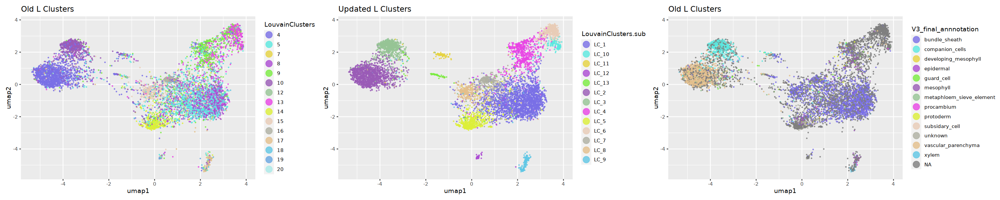

In [68]:
old_annotations <- ggplot(Zm.subcluster_vasculature.clean$meta, aes(x=umap1, y = umap2, color = V3_final_annnotation)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

options(repr.plot.width=25, repr.plot.height=5)
old_clusters + new_clusters + old_annotations

In [71]:
Zm.subcluster_vasculature.clean.clusters$all_genes <- "/home/jpm73279/genome_downloads/Zmicolor.v5.1.prelim.annot/Zmicolorv5.1.gene.bed"
#bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm.all_mergeed_repds.unique.mpq10.tn5.sorted.bed"
genome_file <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM-5.0.fa.fai"
    
### Kernal Corrupted to just linked to the previosly run gene body accessability calculations
Zm.subcluster_vasculature.clean.clusters.counts <- Zm.subcluster_vasculature.clean.clusters
Zm.subcluster_vasculature.clean.clusters.counts$acr_counts_raw <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/zea_mays/clustering/Zm.gene_counts.output"
Zm.subcluster_vasculature.clean.clusters.counts$all_genes <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM_Zm00001eb.1.genes.bed"

## Execute Annotation Attempt #1
Zm.subcluster_vasculature.clean.clusters.final <- run_presto(Zm.subcluster_vasculature.clean.clusters.counts,
           meta_slot = "sub_cluster_vasculature",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

# A tibble: 6 × 25
  cellID     total   tss  acrs  ptmt nSites log10…¹   pTSS   FRiP    pOrg  tss_z
  <chr>      <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl>  <dbl>  <dbl>   <dbl>  <dbl>
1 BC:Z:GTG… 175951 26318 26888  3467  89251    4.95 0.150  0.153  1.97e-2 -0.585
2 BC:Z:GTG… 131016 30764 44240   661  62401    4.80 0.235  0.338  5.05e-3 -0.298
3 BC:Z:GAG…  76035 10459 10258  3856  39118    4.59 0.138  0.135  5.07e-2 -0.625
4 BC:Z:GTG…  69248  3883  1797    45  35925    4.56 0.0561 0.0260 6.50e-4 -0.900
5 BC:Z:GTG…  68731  7341  5026   646  36203    4.56 0.107  0.0731 9.40e-3 -0.729
6 BC:Z:GTT…  62004  5082  4767   409  33124    4.52 0.0820 0.0769 6.60e-3 -0.813
# … with 14 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>, and
#   abbreviated variable name ¹​log10nSites
# A tib

In [72]:
marker_list_maize_file <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/markers/Zm.Combined_total_markers.de_novo.AM.bed"
marker_list_maize <- read_delim(marker_list_maize_file, delim='\t', 
                                       col_names = TRUE)

Rows: 370 Columns: 7
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): chr, start, end, geneID, name, type, tissue

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [73]:
grabbed_top_marker_per_cluster <- top_markers(Zm.subcluster_vasculature.clean.clusters.final$presto_marker, 500)
represented_marker_lst <- list()
for (i in unique(Zm.subcluster_vasculature.clean.clusters.final$sub_cluster_vasculature$LouvainClusters)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(grabbed_top_marker_per_cluster, 
                                           marker_list_maize, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    represented_marker_lst[[i]] <- markers_present_in_presto
}
                 
represented_marker_lst

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
25,Zm00001eb158810,chr3,220987633,220994980,cah1,mesophyll,axillaryBud;leaf
44,Zm00001eb383680,chr9,70927063,70932470,pepc1,mesophyll,axillaryBud;leaf
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
3,Zm00001eb121470,chr3,7184482,7190135,me3,bundle_sheath,axillaryBud;leaf
12,Zm00001eb197410,chr4,196177320,196178190,ssu1,bundle_sheath,axillaryBud;leaf
18,Zm00001eb041120,chr1,216343268,216349212,ccr1,"bundle_sheath,vascular_sclerenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear
47,Zm00001eb033390,chr1,185941269,185953288,dct2,bundle_sheath,axillaryBud;leaf
59,Zm00001eb092540,chr2,147040782,147041974,ssu2,bundle_sheath,axillaryBud;leaf


In [77]:

test <- marker_correlation(Zm.subcluster_vasculature.clean.clusters.counts,
           meta_slot = "sub_cluster_vasculature",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")


library(modelr)
combined_louvain_clusters <- as_tibble(test$corr_matrix) %>%
    pivot_longer(!geneID, names_to = "cluster_name", values_to = "score")  %>% 
    group_by(geneID)  %>% 
      summarize(mean = mean(score),
            var = var(score))

regression <- loess(var ~ mean, data=combined_louvain_clusters)

combined_louvain_clusters.final <- combined_louvain_clusters %>% 
    add_residuals(regression)  %>% 
    arrange(resid, desc = FALSE)  %>% 
    top_n(500)

ℹ Loading preprocessCore


# A tibble: 6 × 25
  cellID     total   tss  acrs  ptmt nSites log10…¹   pTSS   FRiP    pOrg  tss_z
  <chr>      <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl>  <dbl>  <dbl>   <dbl>  <dbl>
1 BC:Z:GTG… 175951 26318 26888  3467  89251    4.95 0.150  0.153  1.97e-2 -0.585
2 BC:Z:GTG… 131016 30764 44240   661  62401    4.80 0.235  0.338  5.05e-3 -0.298
3 BC:Z:GAG…  76035 10459 10258  3856  39118    4.59 0.138  0.135  5.07e-2 -0.625
4 BC:Z:GTG…  69248  3883  1797    45  35925    4.56 0.0561 0.0260 6.50e-4 -0.900
5 BC:Z:GTG…  68731  7341  5026   646  36203    4.56 0.107  0.0731 9.40e-3 -0.729
6 BC:Z:GTT…  62004  5082  4767   409  33124    4.52 0.0820 0.0769 6.60e-3 -0.813
# … with 14 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>, and
#   abbreviated variable name ¹​log10nSites


Rows: 22169188 Columns: 3
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): gene_name, barcode
dbl (1): accessability

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'LouvainClusters'. You can override using the `.groups` argument.


# A tibble: 6 × 4
# Groups:   LouvainClusters [1]
  LouvainClusters geneID          counts  value
  <fct>           <chr>            <dbl>  <dbl>
1 1               Zm00001eb000010     43 10.5  
2 1               Zm00001eb000020     11  2.69 
3 1               Zm00001eb000050      2  0.489
4 1               Zm00001eb000060     67 16.4  
5 1               Zm00001eb000070     43 10.5  
6 1               Zm00001eb000080    169 41.3  


Selecting by resid


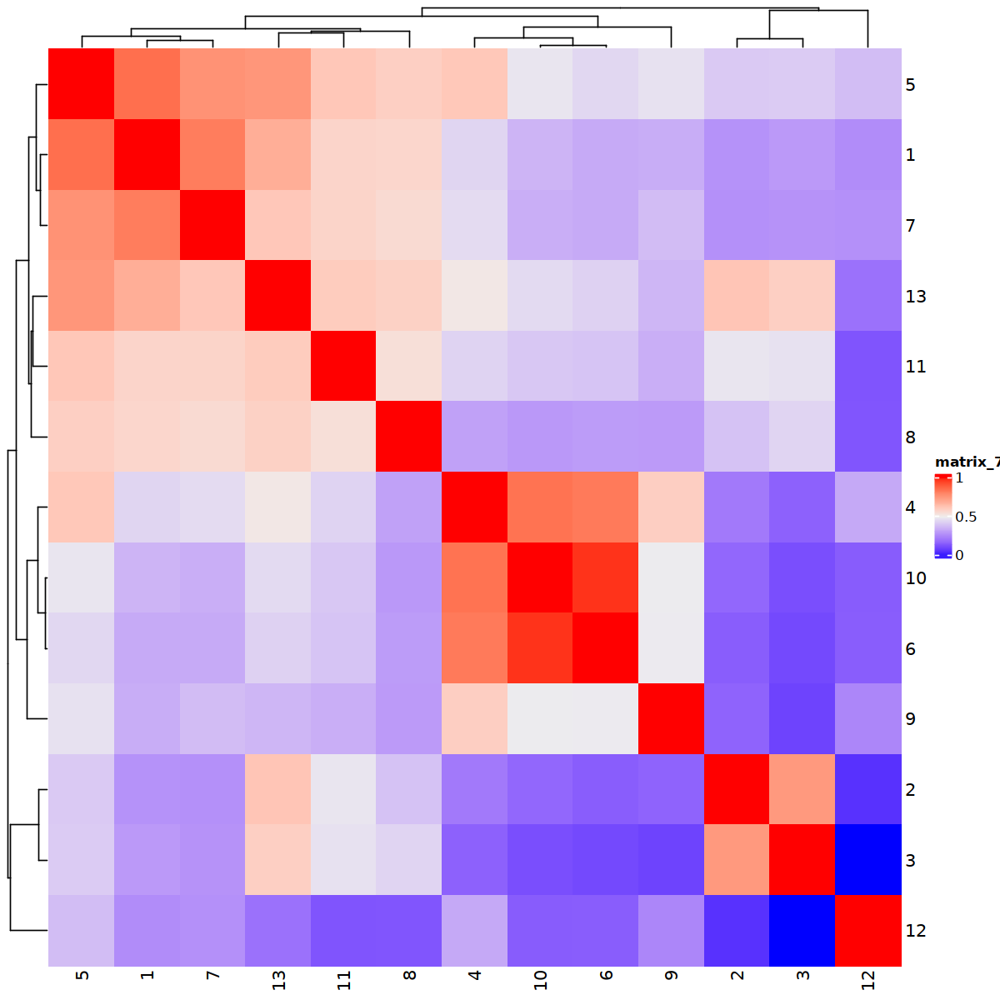

In [78]:

options(repr.plot.width=10, repr.plot.height=10)
corr_matrix <- test$corr_matrix

viz_matrix <- as_tibble(corr_matrix)  %>% 
    dplyr::filter(geneID %in% combined_louvain_clusters.final$geneID)  %>% 
    dplyr::select(-geneID)

Lc_corr_matrix <- cor(data.matrix(viz_matrix))

suppressPackageStartupMessages(library(ComplexHeatmap))
library(ComplexHeatmap)
Heatmap(Lc_corr_matrix)

In [76]:
gathered_markers <- bind_rows(represented_marker_lst, .id = "LouvainCluster")  %>% 
    arrange(LouvainCluster, rank)

Zm.vasculature_annot <- as_tibble(Zm.subcluster_vasculature.clean.clusters.final$sub_cluster_vasculature)

In [66]:
gathered_markers

LouvainCluster,rank,geneID,chr,start,end,name,type,tissue
<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,3,Zm00001eb121470,chr3,7184482,7190135,me3,bundle_sheath,axillaryBud;leaf
1,12,Zm00001eb197410,chr4,196177320,196178190,ssu1,bundle_sheath,axillaryBud;leaf
1,18,Zm00001eb041120,chr1,216343268,216349212,ccr1,"bundle_sheath,vascular_sclerenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear
1,47,Zm00001eb033390,chr1,185941269,185953288,dct2,bundle_sheath,axillaryBud;leaf
1,59,Zm00001eb092540,chr2,147040782,147041974,ssu2,bundle_sheath,axillaryBud;leaf
1,74,Zm00001eb068170,chr2,5128531,5132655,denovo.ID.AM.55,bundle_sheath,leaf
1,80,Zm00001eb195270,chr4,189546416,189552160,denovo.ID.AM.100,"xylem_parenchyma,companion_cell",leaf
1,131,Zm00001eb292690,chr6,169839945,169843008,denovo.ID.AM.135,"xylem,lignified_bundle_sheath",leaf
1,261,Zm00001eb035750,chr1,195328774,195333805,denovo.ID.AM.26,"mesophyll,bundle_sheath",leaf


In [ ]:
Zm.subcluster_vasculature.clean.clusters$sub_cluster_vasculature

In [87]:
Zm.vasculature_sub_annot <- Zm.vasculature_annot %>% 
    dplyr::mutate(Zm.vasculature_lc = str_c("LC", LouvainClusters, sep = "_")) %>%     
    dplyr::mutate(Zm_v4_annot.subcluster_annot = NA)  %>% 
    dplyr::mutate(Zm_v4_annot.subcluster_annot = case_when(Zm.vasculature_lc %in% c("LC_1") ~ "bundle_sheath",
        Zm.vasculature_lc %in% c("LC_2") ~ "vascular_parenchyma",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_3") ~ "copmanion_cells",        
        Zm.vasculature_lc %in% c("LC_4") ~ "merged_group_1",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_5") ~ "bundle_sheath",
        Zm.vasculature_lc %in% c("LC_6") ~ "merged_group_1",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_7") ~ "bundle_sheath",
        Zm.vasculature_lc %in% c("LC_8") ~ "merged_group_1",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_9") ~ "protoderm",
        Zm.vasculature_lc %in% c("LC_10") ~ "merged_group_1",                                                                                                                   
        Zm.vasculature_lc %in% c("LC_11") ~ "Unknown_1",
        Zm.vasculature_lc %in% c("LC_12") ~ "None",                                                                                                                   
        Zm.vasculature_lc %in% c("LC_13") ~ "xylem_parenchyma",
        TRUE ~ "unknown_clusters"))

In [ ]:
Zm.vasculature_sub_annot

In [89]:
Zm.vasculature_sub_annot$Zm.vasculature_lc

[1] "LC_4"  "LC_1"  "LC_4"  "LC_10" "LC_6"  "LC_6"  "LC_4"  "LC_5"  "LC_6" 
  [10] "LC_6"  "LC_4"  "LC_6"  "LC_1"  "LC_6"  "LC_4"  "LC_4"  "LC_4"  "LC_5" 
  [19] "LC_1"  "LC_6"  "LC_6"  "LC_6"  "LC_6"  "LC_4"  "LC_6"  "LC_10" "LC_4" 
  [28] "LC_9"  "LC_6"  "LC_4"  "LC_6"  "LC_3"  "LC_6"  "LC_3"  "LC_10" "LC_1" 
  [37] "LC_11" "LC_4"  "LC_4"  "LC_6"  "LC_1"  "LC_6"  "LC_1"  "LC_5"  "LC_4" 
  [46] "LC_4"  "LC_4"  "LC_6"  "LC_1"  "LC_6"  "LC_9"  "LC_5"  "LC_6"  "LC_6" 
  [55] "LC_6"  "LC_6"  "LC_4"  "LC_6"  "LC_13" "LC_11" "LC_1"  "LC_4"  "LC_9" 
  [64] "LC_10" "LC_4"  "LC_1"  "LC_4"  "LC_8"  "LC_2"  "LC_10" "LC_9"  "LC_6" 
  [73] "LC_9"  "LC_6"  "LC_3"  "LC_3"  "LC_1"  "LC_9"  "LC_8"  "LC_10" "LC_6" 
  [82] "LC_4"  "LC_10" "LC_4"  "LC_6"  "LC_7"  "LC_6"  "LC_1"  "LC_6"  "LC_10"
  [91] "LC_2"  "LC_1"  "LC_6"  "LC_7"  "LC_3"  "LC_6"  "LC_8"  "LC_6"  "LC_1" 
 [100] "LC_5"  "LC_4"  "LC_4"  "LC_6"  "LC_4"  "LC_6"  "LC_1"  "LC_1"  "LC_4" 
 [109] "LC_4"  "LC_6"  "LC_4"  "LC_2"  "LC_6"  "LC_5"  "LC_1"  "LC_13" "LC_6" 
 [118] "LC_4"  "LC_4"  "LC_5"  "LC_6"  "LC_4"  "LC_4"  "LC_6"  "LC_7"  "LC_5" 
 [127] "LC_4"  "LC_4"  "LC_9"  "LC_4"  "LC_9"  "LC_5"  "LC_6"  "LC_13" "LC_9" 
 [136] "LC_6"  "LC_9"  "LC_4"  "LC_1"  "LC_6"  "LC_4"  "LC_4"  "LC_6"  "LC_2" 
 [145] "LC_6"  "LC_1"  "LC_4"  "LC_10" "LC_3"  "LC_1"  "LC_1"  "LC_4"  "LC_6" 
 [154] "LC_10" "LC_2"  "LC_6"  "LC_1"  "LC_1"  "LC_6"  "LC_4"  "LC_6"  "LC_2" 
 [163] "LC_6"  "LC_6"  "LC_4"  "LC_4"  "LC_6"  "LC_10" "LC_4"  "LC_2"  "LC_9" 
 [172] "LC_10" "LC_6"  "LC_6"  "LC_4"  "LC_6"  "LC_9"  "LC_6"  "LC_5"  "LC_4" 
 [181] "LC_11" "LC_1"  "LC_4"  "LC_4"  "LC_4"  "LC_1"  "LC_6"  "LC_1"  "LC_4" 
 [190] "LC_6"  "LC_6"  "LC_1"  "LC_2"  "LC_1"  "LC_3"  "LC_5"  "LC_10" "LC_4" 
 [199] "LC_1"  "LC_2"  "LC_3"  "LC_4"  "LC_5"  "LC_6"  "LC_5"  "LC_2"  "LC_6" 
 [208] "LC_2"  "LC_6"  "LC_8"  "LC_6"  "LC_6"  "LC_6"  "LC_1"  "LC_6"  "LC_10"
 [217] "LC_4"  "LC_1"  "LC_10" "LC_1"  "LC_1"  "LC_4"  "LC_4"  "LC_6"  "LC_1" 
 [226] "LC_1"  "LC_12" "LC_6"  "LC_12" "LC_1"  "LC_6"  "LC_4"  "LC_4"  "LC_6" 
 [235] "LC_4"  "LC_5"  "LC_1"  "LC_6"  "LC_6"  "LC_6"  "LC_6"  "LC_7"  "LC_1" 
 [244] "LC_10" "LC_1"  "LC_1"  "LC_9"  "LC_10" "LC_8"  "LC_6"  "LC_4"  "LC_2" 
 [253] "LC_2"  "LC_9"  "LC_1"  "LC_4"  "LC_4"  "LC_6"  "LC_5"  "LC_4"  "LC_4" 
 [262] "LC_10" "LC_1"  "LC_11" "LC_6"  "LC_6"  "LC_7"  "LC_5"  "LC_1"  "LC_3" 
 [271] "LC_4"  "LC_1"  "LC_6"  "LC_6"  "LC_6"  "LC_2"  "LC_10" "LC_6"  "LC_2" 
 [280] "LC_1"  "LC_6"  "LC_6"  "LC_2"  "LC_4"  "LC_6"  "LC_2"  "LC_1"  "LC_6" 
 [289] "LC_2"  "LC_11" "LC_9"  "LC_9"  "LC_4"  "LC_3"  "LC_4"  "LC_5"  "LC_2" 
 [298] "LC_3"  "LC_6"  "LC_6"  "LC_7"  "LC_6"  "LC_6"  "LC_6"  "LC_1"  "LC_4" 
 [307] "LC_1"  "LC_4"  "LC_7"  "LC_9"  "LC_4"  "LC_1"  "LC_12" "LC_1"  "LC_6" 
 [316] "LC_8"  "LC_1"  "LC_1"  "LC_1"  "LC_6"  "LC_9"  "LC_6"  "LC_1"  "LC_4" 
 [325] "LC_10" "LC_8"  "LC_4"  "LC_8"  "LC_6"  "LC_6"  "LC_6"  "LC_1"  "LC_5" 
 [334] "LC_6"  "LC_1"  "LC_2"  "LC_1"  "LC_6"  "LC_4"  "LC_5"  "LC_4"  "LC_6" 
 [343] "LC_1"  "LC_2"  "LC_2"  "LC_2"  "LC_6"  "LC_1"  "LC_1"  "LC_3"  "LC_4" 
 [352] "LC_6"  "LC_4"  "LC_3"  "LC_7"  "LC_1"  "LC_6"  "LC_1"  "LC_10" "LC_1" 
 [361] "LC_1"  "LC_4"  "LC_4"  "LC_1"  "LC_5"  "LC_1"  "LC_4"  "LC_1"  "LC_6" 
 [370] "LC_1"  "LC_10" "LC_6"  "LC_4"  "LC_6"  "LC_4"  "LC_4"  "LC_2"  "LC_1" 
 [379] "LC_1"  "LC_1"  "LC_4"  "LC_6"  "LC_1"  "LC_6"  "LC_5"  "LC_3"  "LC_3" 
 [388] "LC_6"  "LC_3"  "LC_3"  "LC_7"  "LC_2"  "LC_5"  "LC_6"  "LC_1"  "LC_6" 
 [397] "LC_9"  "LC_3"  "LC_6"  "LC_2"  "LC_6"  "LC_6"  "LC_1"  "LC_7"  "LC_5" 
 [406] "LC_1"  "LC_2"  "LC_2"  "LC_4"  "LC_10" "LC_6"  "LC_4"  "LC_4"  "LC_10"
 [415] "LC_10" "LC_6"  "LC_1"  "LC_6"  "LC_7"  "LC_2"  "LC_2"  "LC_5"  "LC_4" 
 [424] "LC_3"  "LC_1"  "LC_2"  "LC_1"  "LC_3"  "LC_9"  "LC_2"  "LC_4"  "LC_2" 
 [433] "LC_2"  "LC_6"  "LC_4"  "LC_1"  "LC_4"  "LC_4"  "LC_4"  "LC_5"  "LC_13"
 [442] "LC_6"  "LC_6"  "LC_2"  "LC_4"  "LC_5"  "LC_13" "LC_1"  "LC_6"  "LC_1" 
 [451] "LC_1"  "LC_4"  "LC_6"  "LC_4"  "LC_7"  "LC_1"

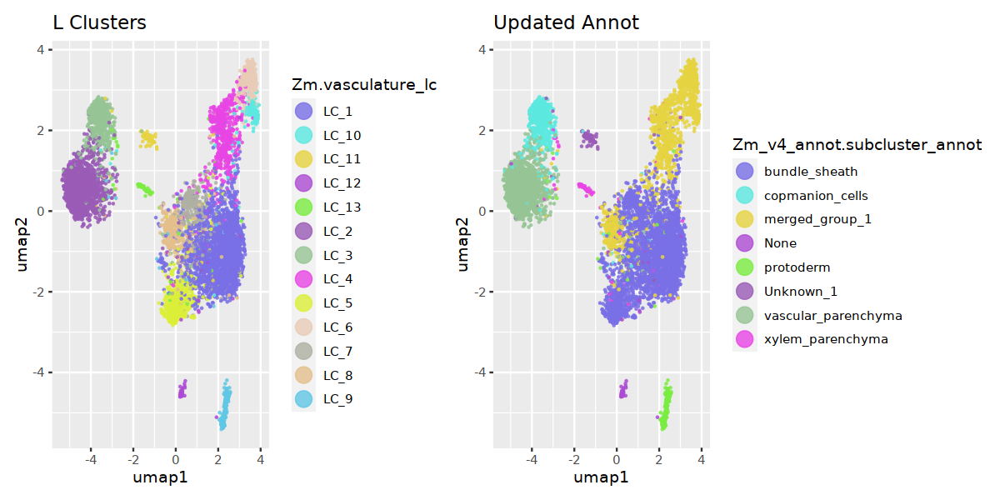

In [80]:
options(repr.plot.width=10, repr.plot.height=5)
LC_meso <- ggplot(Zm.vasculature_sub_annot, aes(x=umap1, y = umap2, color = Zm.vasculature_lc)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

meso_annot <- ggplot(Zm.vasculature_sub_annot, aes(x=umap1, y = umap2, color = Zm_v4_annot.subcluster_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Annot")

LC_meso + meso_annot

In [91]:
# Merging 3/5/11
library(presto)
Zm.subcluster_vasculature.clean.clusters.counts$vasculature_annot_v1 <- Zm.vasculature_sub_annot

Zm.subcluster_vasculature.clean.clusters.final <- run_presto(Zm.subcluster_vasculature.clean.clusters.counts,
           meta_slot = "vasculature_annot_v1",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot.subcluster_annot")

vasc_sub_annot.top_markers <- top_markers(Zm.subcluster_vasculature.clean.clusters.final$presto_marker, 200)

vasc_v1.sub_marker_list <- list()
for (i in unique(Zm.subcluster_vasculature.clean.clusters.final$vasculature_annot_v1$Zm_v4_annot.subcluster_annot)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(vasc_sub_annot.top_markers, 
                                           marker_list_maize, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    vasc_v1.sub_marker_list[[i]] <- markers_present_in_presto
}
                 
vasc_v1.sub_marker_list

# A tibble: 6 × 27
  cellID     total   tss  acrs  ptmt nSites log10…¹   pTSS   FRiP    pOrg  tss_z
  <chr>      <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl>  <dbl>  <dbl>   <dbl>  <dbl>
1 BC:Z:GTG… 175951 26318 26888  3467  89251    4.95 0.150  0.153  1.97e-2 -0.585
2 BC:Z:GTG… 131016 30764 44240   661  62401    4.80 0.235  0.338  5.05e-3 -0.298
3 BC:Z:GAG…  76035 10459 10258  3856  39118    4.59 0.138  0.135  5.07e-2 -0.625
4 BC:Z:GTG…  69248  3883  1797    45  35925    4.56 0.0561 0.0260 6.50e-4 -0.900
5 BC:Z:GTG…  68731  7341  5026   646  36203    4.56 0.107  0.0731 9.40e-3 -0.729
6 BC:Z:GTT…  62004  5082  4767   409  33124    4.52 0.0820 0.0769 6.60e-3 -0.813
# … with 16 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>,
#   Zm.vasculature_lc <chr>, Zm_v4_annot.subcluster_ann

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2,Zm00001eb121470,chr3,7184482,7190135,me3,bundle_sheath,axillaryBud;leaf
8,Zm00001eb197410,chr4,196177320,196178190,ssu1,bundle_sheath,axillaryBud;leaf
15,Zm00001eb041120,chr1,216343268,216349212,ccr1,"bundle_sheath,vascular_sclerenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear
41,Zm00001eb033390,chr1,185941269,185953288,dct2,bundle_sheath,axillaryBud;leaf
49,Zm00001eb092540,chr2,147040782,147041974,ssu2,bundle_sheath,axillaryBud;leaf
76,Zm00001eb068170,chr2,5128531,5132655,denovo.ID.AM.55,bundle_sheath,leaf
103,Zm00001eb292690,chr6,169839945,169843008,denovo.ID.AM.135,"xylem,lignified_bundle_sheath",leaf


In [ ]:
gathered_markers <- bind_rows(vasc_v1.sub_marker_list, .id = "LouvainCluster")  %>% 
    arrange(Zm.vasculature_, rank)


gathered_markers

In [ ]:
Zm.subcluster_vasculature.clean.clusters.final <- marker_correlation(Zm.subcluster_vasculature.clean.clusters.counts,
           meta_slot = "vasculature_annot_v1",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot.subcluster_annot")



library(modelr)
combined_louvain_clusters <- as_tibble(Zm.subcluster_vasculature.clean.clusters.final$corr_matrix) %>%
    pivot_longer(!geneID, names_to = "cluster_name", values_to = "score")  %>% 
    group_by(geneID)  %>% 
      summarize(mean = mean(score),
            var = var(score))

regression <- loess(var ~ mean, data=combined_louvain_clusters)

combined_louvain_clusters.final <- combined_louvain_clusters %>% 
    add_residuals(regression)  %>% 
    arrange(resid, desc = FALSE)  %>% 
    top_n(500)

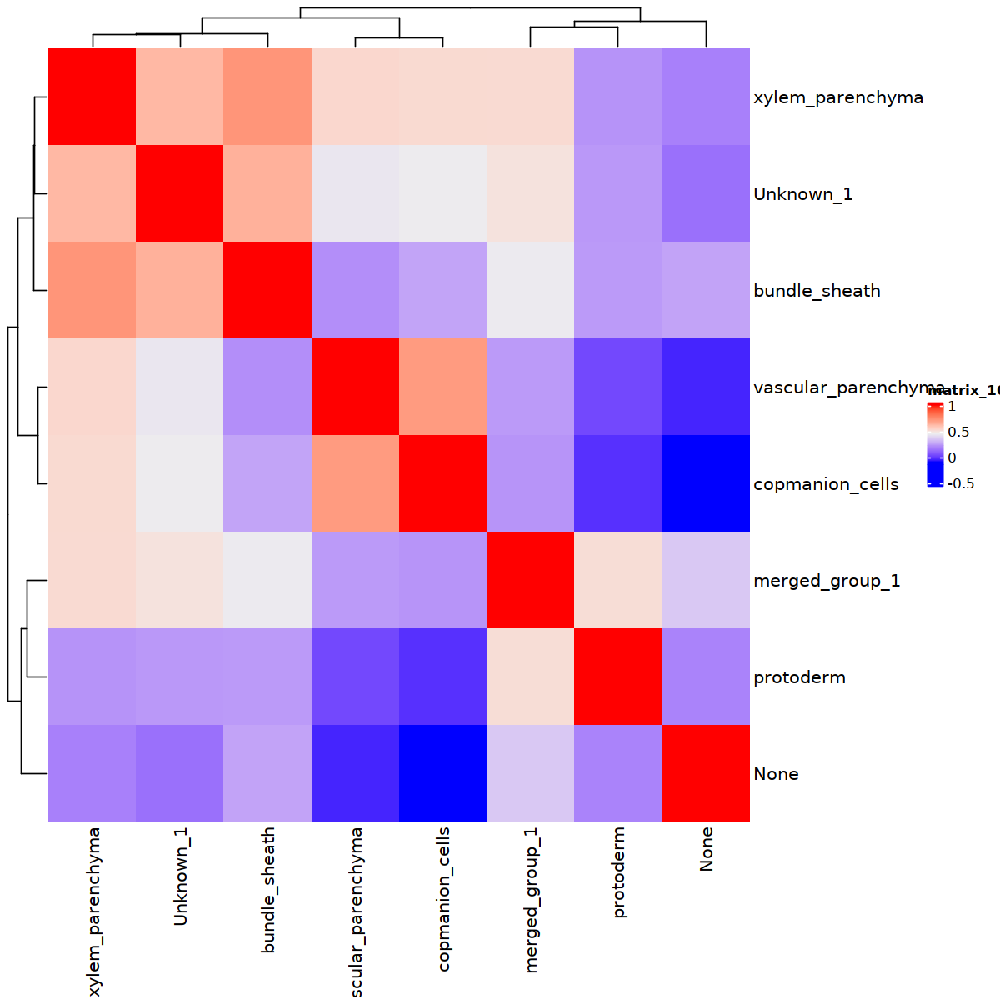

In [95]:
options(repr.plot.width=10, repr.plot.height=10)
corr_matrix <- Zm.subcluster_vasculature.clean.clusters.final$corr_matrix

viz_matrix <- as_tibble(corr_matrix)  %>% 
    dplyr::filter(geneID %in% combined_louvain_clusters.final$geneID)  %>% 
    dplyr::select(-geneID)

Lc_corr_matrix <- cor(data.matrix(viz_matrix))

suppressPackageStartupMessages(library(ComplexHeatmap))
library(ComplexHeatmap)
Heatmap(Lc_corr_matrix)

In [96]:
saveRDS(Zm.subcluster_vasculature.clean.clusters.final, "/home/jpm73279/Zm.subcluster_annot.intermediate.rds")

In [2]:
Zm.subcluster_vasculature.clean.clusters.final <- readRDS("/home/jpm73279/Zm.subcluster_annot.intermediate.rds")

In [ ]:
Zm.subcluster_vasculature.clean.clusters.final

In [7]:
grabbed_vasc_sub_cluster <- Zm.subcluster_vasculature.clean.clusters.final$vasculature_annot_v1
write.table(grabbed_vasc_sub_cluster, file=paste0("/scratch/jpm73279/comparative_single_cell/quick_visualize/","Zm.vasculature_subclustering_meta.txt"), quote=F, row.names=T, col.names=T, sep="\t")

In [10]:
str(Zm.subcluster_vasculature.clean.clusters.final)

List of 15
 $ counts                 :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. ..@ i       : int [1:4078275] 6 8 12 26 27 29 31 32 34 41 ...
  .. ..@ p       : int [1:7914] 0 6083 15340 17629 18084 19499 20764 23666 32887 34216 ...
  .. ..@ Dim     : int [1:2] 27667 7913
  .. ..@ Dimnames:List of 2
  .. .. ..$ : chr [1:27667] "chr1_100176001_100177000" "chr1_100182001_100183000" "chr1_100184001_100185000" "chr1_100274001_100275000" ...
  .. .. ..$ : chr [1:7913] "BC:Z:GTGAAAGGCTACAAACAATGAGCTCGGA-Zm_rep1_P4_10x.rep1" "BC:Z:GTGAAAGATCAGAGCGAGTGGCCACTAA-Zm_rep1_P4_10x.rep1" "BC:Z:GAGTGGAGTTCCAGCGAGTCCGCACTAA-Zm_rep1_P8_10x.rep1" "BC:Z:GTGAAAATGTCAAGCGAGTTTCGACTAA-Zm_rep1_P4_10x.rep1" ...
  .. ..@ x       : num [1:4078275] 1 1 1 1 1 1 1 1 1 1 ...
  .. ..@ factors : list()
 $ meta                   :'data.frame':	7913 obs. of  25 variables:
  ..$ cellID              : chr [1:7913] "BC:Z:GTGAAAGGCTACAAACAATGAGCTCGGA-Zm_rep1_P4_10x.rep1" "BC:Z:GTGAAAGATCAGAGCGAGTGGCCACTA

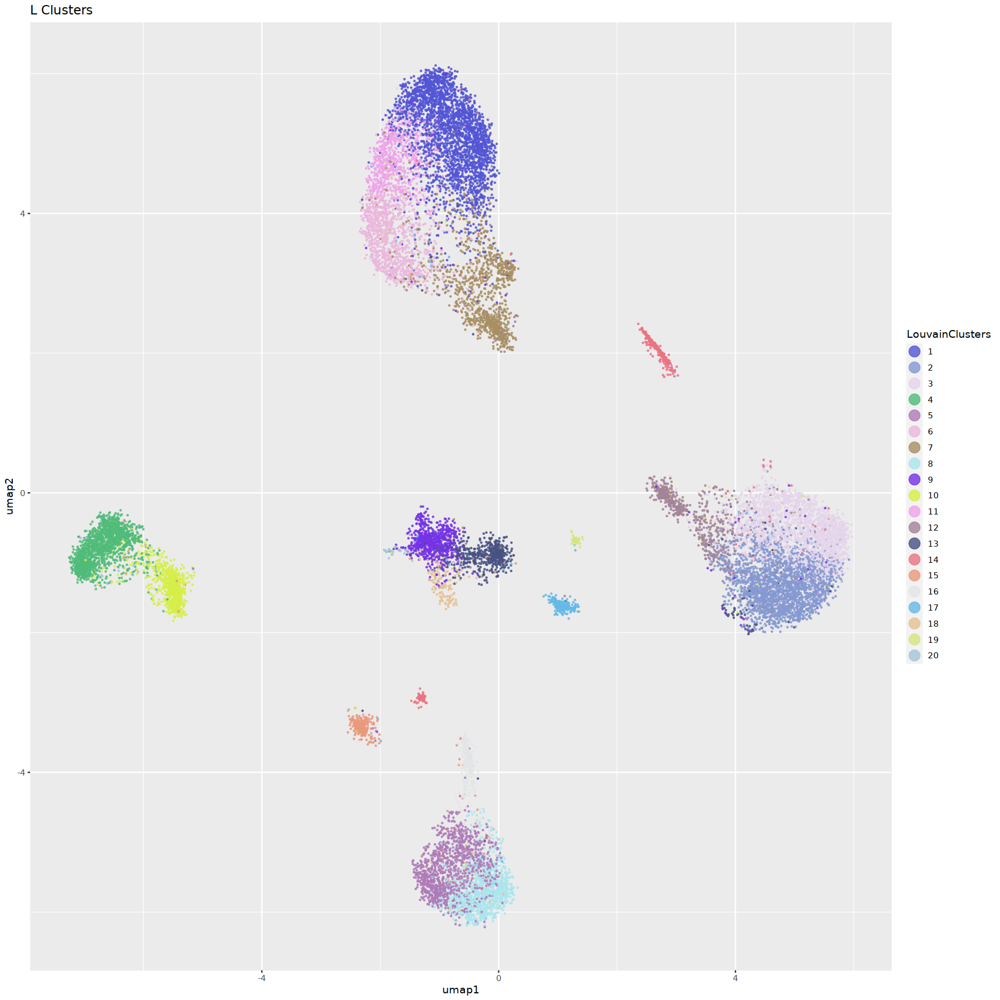

In [13]:
LC_meso <- ggplot(loaded_socrates_data$Clusters, aes(x=umap1, y = umap2, color = LouvainClusters)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

LC_meso

In [81]:
Zm.vasculature_annot <- Zm.subcluster_vasculature.clean.clusters.final$vasculature_annot_v1

Zm.vasculature_sub_annot <- Zm.vasculature_annot %>% 
    dplyr::mutate(Zm.vasculature_lc = str_c("LC", LouvainClusters, sep = "_")) %>%     
    dplyr::mutate(Zm_v4_annot.subcluster_annot = NA)  %>% 
    dplyr::mutate(Zm_v4_annot.subcluster_annot = case_when(Zm.vasculature_lc %in% c("LC_1") ~ "bundle_sheath",
        Zm.vasculature_lc %in% c("LC_2") ~ "sieve_elements",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_3") ~ "companion_cells",        
        Zm.vasculature_lc %in% c("LC_4") ~ "ground_meristem",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_5") ~ "bulliform",
        Zm.vasculature_lc %in% c("LC_6") ~ "ground_meristem",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_7") ~ "bundle_sheath",
        Zm.vasculature_lc %in% c("LC_8") ~ "procambium",                                                                                                                    
        Zm.vasculature_lc %in% c("LC_9") ~ "protoderm",
        Zm.vasculature_lc %in% c("LC_10") ~ "ground_meristem",                                                                                                                   
        Zm.vasculature_lc %in% c("LC_11") ~ "proto_xylem",
        Zm.vasculature_lc %in% c("LC_12") ~ "None",                                                                                                                   
        Zm.vasculature_lc %in% c("LC_13") ~ "proto_phloem",
        TRUE ~ "unknown_clusters"))  %>% 
    dplyr::mutate(Zm_v4_annot = Zm_v4_annot.subcluster_annot)

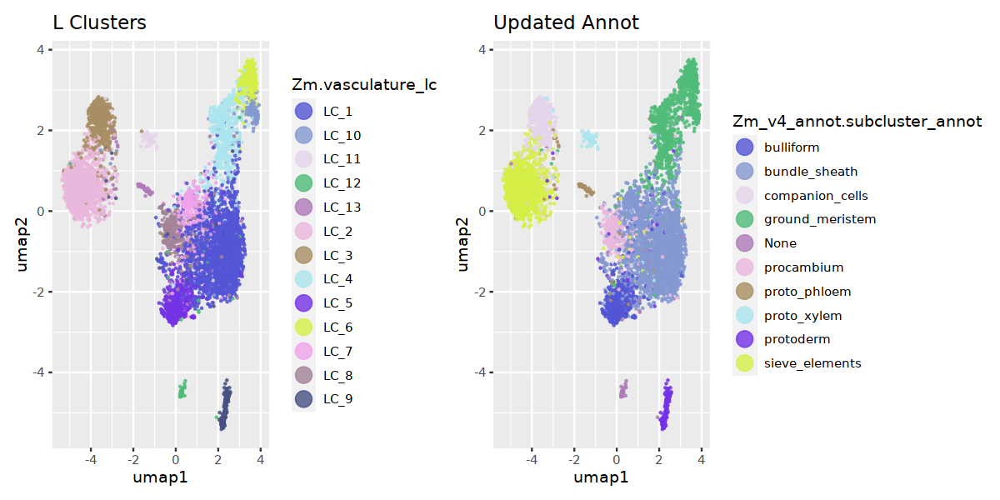

In [82]:
options(repr.plot.width=10, repr.plot.height=5)
LC_vasc <- ggplot(Zm.vasculature_sub_annot, aes(x=umap1, y = umap2, color = Zm.vasculature_lc)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

vasc_annot <- ggplot(Zm.vasculature_sub_annot, aes(x=umap1, y = umap2, color = Zm_v4_annot.subcluster_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Annot")

LC_vasc + vasc_annot

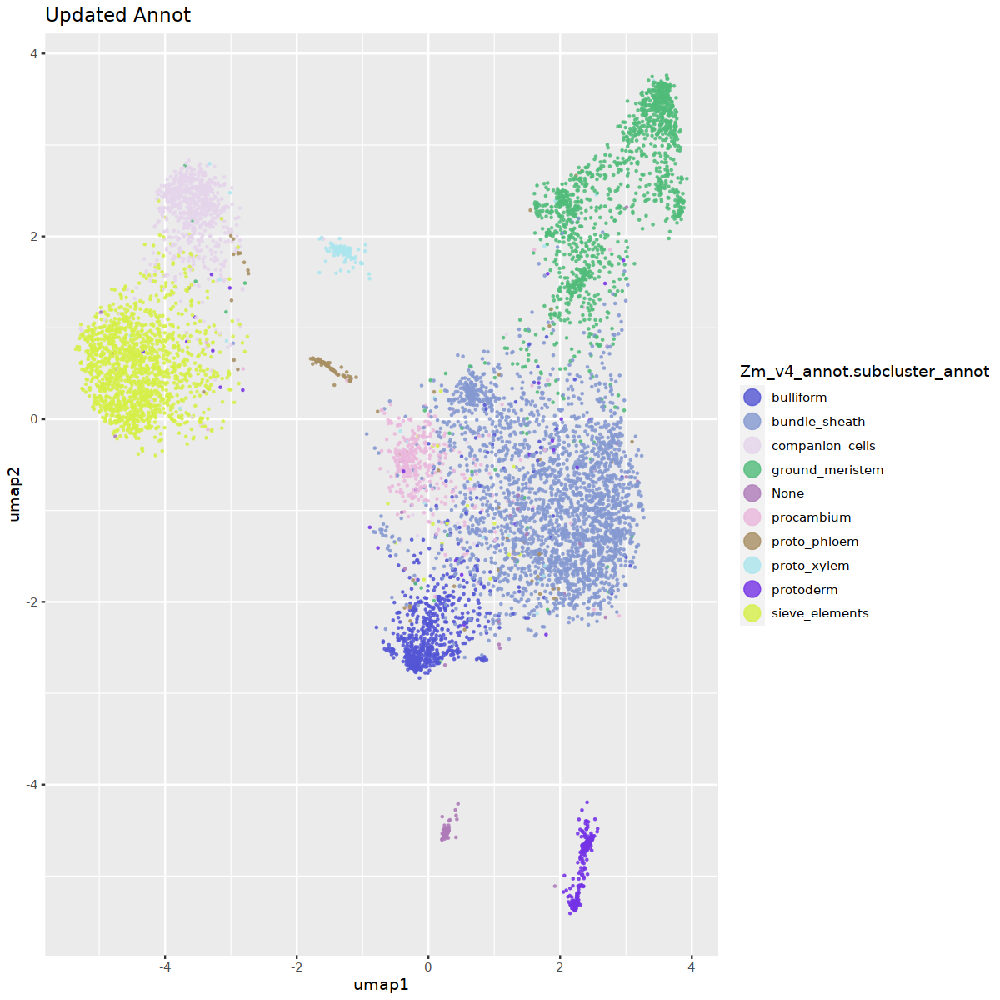

In [83]:
options(repr.plot.width=10, repr.plot.height=10)
vasc_annot

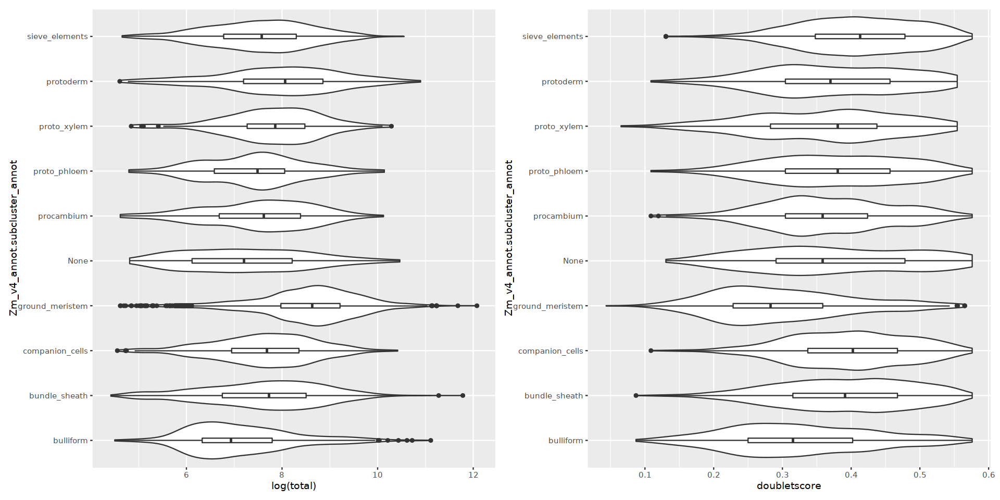

In [84]:
library(patchwork)
options(repr.plot.width=16, repr.plot.height=8)
total_tn5 <- ggplot(Zm.vasculature_sub_annot, aes(x = Zm_v4_annot.subcluster_annot, y = log(total))) + 
    geom_violin() + 
    geom_boxplot(width = .1) +
      coord_flip()


doublet_score <- ggplot(Zm.vasculature_sub_annot, aes(x = Zm_v4_annot.subcluster_annot, y = doubletscore)) + 
    geom_violin() + 
    geom_boxplot(width = .1) +
      coord_flip()


total_tn5 + doublet_score


In [85]:
Zm.subcluster_vasc_updated_annotations <- Zm.vasculature_sub_annot  %>% 
    dplyr::mutate(Zm_v4_annot = Zm_v4_annot.subcluster_annot)  %>% 
    mutate(across(c(LouvainClusters),factor))  %>% 
    dplyr::select(cellID, Zm_v4_annot, Zm_v4_annot.subcluster_annot, Zm.vasculature_lc)

In [86]:
colnames(loaded_socrates_data$Clusters)

[1] "cellID"          "total"           "tss"             "acrs"           
 [5] "ptmt"            "nSites"          "log10nSites"     "pTSS"           
 [9] "FRiP"            "pOrg"            "tss_z"           "acr_z"          
[13] "sites_z"         "qc_check"        "background"      "cellbulk"       
[17] "is_cell"         "sampleID"        "umap1"           "umap2"          
[21] "doubletscore"    "d.type"          "ptmt_ratio"      "LouvainClusters"

In [87]:
Zm.subcluster_vasculature.final_meta <- loaded_socrates_data$Clusters  %>% 
    dplyr::filter(cellID %in% Zm.subcluster_vasc_updated_annotations$cellID)  %>% 
    left_join(., Zm.subcluster_vasc_updated_annotations, by = "cellID")  %>% 
    mutate(across(c(LouvainClusters),factor))
    

In [88]:
colnames(Zm.subcluster_vasculature.final_meta)

[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm_v4_annot"                  "Zm_v4_annot.subcluster_annot"
[27] "Zm.vasculature_lc"

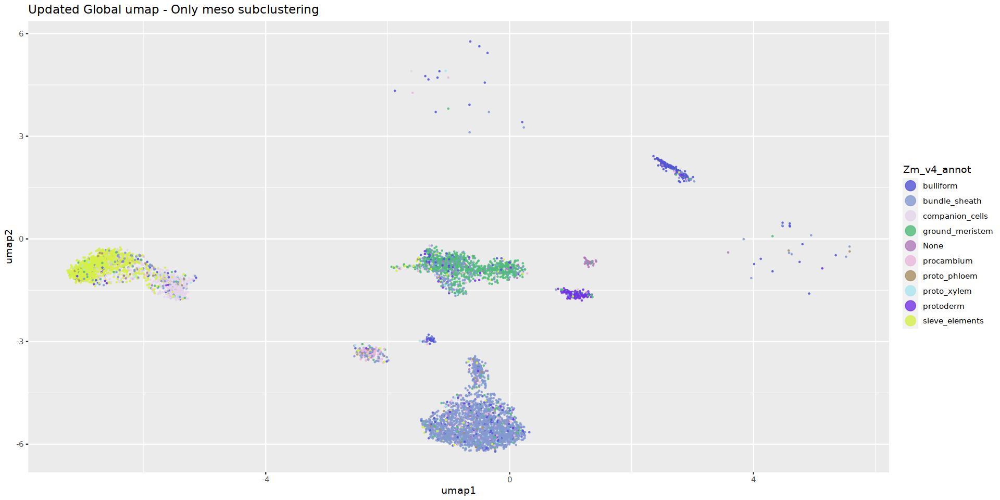

In [89]:
global_umap_only_vasculature <- ggplot(Zm.subcluster_vasculature.final_meta, aes(x=umap1, y = umap2, color = Zm_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Global umap - Only meso subclustering")

global_umap_only_vasculature

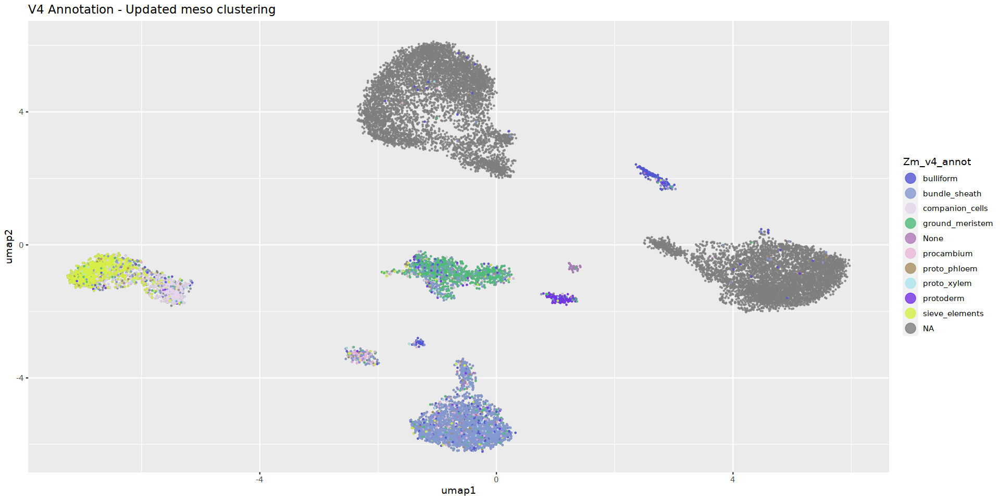

In [90]:


`%ni%` <- Negate(`%in%`)

v4_annot_filtered_cells <- loaded_socrates_data$Clusters  %>% 
    dplyr::filter(cellID %ni% Zm.subcluster_vasculature.final_meta)  %>% 
      mutate(across(c(LouvainClusters),factor))


Zm.combined_vasc <- bind_rows(v4_annot_filtered_cells, Zm.subcluster_vasculature.final_meta)

updated_meso_annot_global <- ggplot(Zm.combined_vasc, aes(x=umap1, y = umap2, color = Zm_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("V4 Annotation - Updated meso clustering")

updated_meso_annot_global

In [91]:
Zm.combined_vasc

,cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,sampleID,umap1,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters,Zm_v4_annot,Zm_v4_annot.subcluster_annot,Zm.vasculature_lc
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>,<chr>,<chr>,<chr>
BC:Z:GTGAAAGGCTACAAACAATGAGCTCGGA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAGGCTACAAACAATGAGCTCGGA-Zm_rep1_P4_10x.rep1,175951,26318,26888,3467,122915,5.089605,0.14957573,0.15281527,0.0197043495,⋯,rep1,-0.57539534,-0.8122125,0.2826087,singlet,0.0197043495,13,NA,NA,NA
BC:Z:GTGAAAGATCAGAGCGAGTGGCCACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAGATCAGAGCGAGTGGCCACTAA-Zm_rep1_P4_10x.rep1,131016,30764,44240,661,87503,4.942023,0.23481102,0.33766868,0.0050451853,⋯,rep1,-0.46672346,-4.7543831,0.2826087,singlet,0.0050451853,8,NA,NA,NA
BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,81977,11518,13790,308,56566,4.752555,0.14050282,0.16821791,0.0037571514,⋯,rep1,-0.04450613,2.2794000,0.3369565,singlet,0.0037571514,7,NA,NA,NA
BC:Z:GAGTGGAGTTCCAGCGAGTCCGCACTAA-Zm_rep1_P8_10x.rep1,BC:Z:GAGTGGAGTTCCAGCGAGTCCGCACTAA-Zm_rep1_P8_10x.rep1,76035,10459,10258,3856,53253,4.726344,0.13755507,0.13491155,0.0507134872,⋯,rep1,-1.42091571,-0.7719665,0.2282609,singlet,0.0507134872,9,NA,NA,NA
BC:Z:GTGAAAATGTCAAGCGAGTTTCGACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAATGTCAAGCGAGTTTCGACTAA-Zm_rep1_P4_10x.rep1,69248,3883,1797,45,49831,4.697500,0.05607382,0.02595021,0.0006498383,⋯,rep1,-0.05815693,-0.9040868,0.1847826,singlet,0.0006498383,13,NA,NA,NA
BC:Z:GTGAAAAGTCAAAGCGAGTGGCCAACAT-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAAGTCAAAGCGAGTGGCCAACAT-Zm_rep1_P4_10x.rep1,68731,7341,5026,646,49388,4.693621,0.10680770,0.07312566,0.0093989612,⋯,rep1,-0.93301081,-1.1102309,0.2934783,singlet,0.0093989612,9,NA,NA,NA
BC:Z:GTGGCCTAGCTTCTAAGACTGATACCGG-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCTAGCTTCTAAGACTGATACCGG-Zm_rep1_P5_10x.rep1,69259,11480,15110,627,49210,4.692053,0.16575463,0.21816659,0.0090529751,⋯,rep1,-1.04066037,6.0375724,0.4347826,singlet,0.0090529751,1,NA,NA,NA
BC:Z:GTTTCGAGTTCCGTAGTATTCCTGTTTC-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGAGTTCCGTAGTATTCCTGTTTC-Zm_rep1_P6_10x.rep1,62004,5082,4767,409,45683,4.659755,0.08196245,0.07688214,0.0065963486,⋯,rep1,-0.98859810,-1.5461164,0.5434783,singlet,0.0065963486,18,NA,NA,NA
BC:Z:GAGTGGCTTGTAAGCGAATTCCTAGCTT-Zm_rep1_P8_10x.rep1,BC:Z:GAGTGGCTTGTAAGCGAATTCCTAGCTT-Zm_rep1_P8_10x.rep1,59958,11718,11094,1375,43327,4.636759,0.19543681,0.18502952,0.0229327196,⋯,rep1,-0.79161381,-0.8708301,0.2500000,singlet,0.0229327196,9,NA,NA,NA


In [92]:
loaded_socrates_data$Clusters

,cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,background,cellbulk,is_cell,sampleID,umap1,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>
BC:Z:GTGAAAGGCTACAAACAATGAGCTCGGA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAGGCTACAAACAATGAGCTCGGA-Zm_rep1_P4_10x.rep1,175951,26318,26888,3467,122915,5.089605,0.14957573,0.15281527,0.0197043495,⋯,0.0091917253,0.0860390077,1,rep1,-0.57539534,-0.8122125,0.2826087,singlet,0.0197043495,13
BC:Z:GTGAAAGATCAGAGCGAGTGGCCACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAGATCAGAGCGAGTGGCCACTAA-Zm_rep1_P4_10x.rep1,131016,30764,44240,661,87503,4.942023,0.23481102,0.33766868,0.0050451853,⋯,0.0068059469,0.1398698928,1,rep1,-0.46672346,-4.7543831,0.2826087,singlet,0.0050451853,8
BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,81977,11518,13790,308,56566,4.752555,0.14050282,0.16821791,0.0037571514,⋯,0.0062822987,0.0700597013,1,rep1,-0.04450613,2.2794000,0.3369565,singlet,0.0037571514,7
BC:Z:GAGTGGAGTTCCAGCGAGTCCGCACTAA-Zm_rep1_P8_10x.rep1,BC:Z:GAGTGGAGTTCCAGCGAGTCCGCACTAA-Zm_rep1_P8_10x.rep1,76035,10459,10258,3856,53253,4.726344,0.13755507,0.13491155,0.0507134872,⋯,0.0099050480,0.0410461561,1,rep1,-1.42091571,-0.7719665,0.2282609,singlet,0.0507134872,9
BC:Z:GTGAAAATGTCAAGCGAGTTTCGACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAATGTCAAGCGAGTTTCGACTAA-Zm_rep1_P4_10x.rep1,69248,3883,1797,45,49831,4.697500,0.05607382,0.02595021,0.0006498383,⋯,0.0025490591,0.0042495036,1,rep1,-0.05815693,-0.9040868,0.1847826,singlet,0.0006498383,13
BC:Z:GTGAAAAGTCAAAGCGAGTGGCCAACAT-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAAGTCAAAGCGAGTGGCCAACAT-Zm_rep1_P4_10x.rep1,68731,7341,5026,646,49388,4.693621,0.10680770,0.07312566,0.0093989612,⋯,0.0072654894,0.0259990356,1,rep1,-0.93301081,-1.1102309,0.2934783,singlet,0.0093989612,9
BC:Z:GTGGCCTAGCTTCTAAGACTGATACCGG-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCTAGCTTCTAAGACTGATACCGG-Zm_rep1_P5_10x.rep1,69259,11480,15110,627,49210,4.692053,0.16575463,0.21816659,0.0090529751,⋯,0.0051131512,0.0980970930,1,rep1,-1.04066037,6.0375724,0.4347826,singlet,0.0090529751,1
BC:Z:GTTTCGAGTTCCGTAGTATTCCTGTTTC-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGAGTTCCGTAGTATTCCTGTTTC-Zm_rep1_P6_10x.rep1,62004,5082,4767,409,45683,4.659755,0.08196245,0.07688214,0.0065963486,⋯,0.0065027616,0.0464638042,1,rep1,-0.98859810,-1.5461164,0.5434783,singlet,0.0065963486,18
BC:Z:GAGTGGCTTGTAAGCGAATTCCTAGCTT-Zm_rep1_P8_10x.rep1,BC:Z:GAGTGGCTTGTAAGCGAATTCCTAGCTT-Zm_rep1_P8_10x.rep1,59958,11718,11094,1375,43327,4.636759,0.19543681,0.18502952,0.0229327196,⋯,0.0068969122,0.0511279755,1,rep1,-0.79161381,-0.8708301,0.2500000,singlet,0.0229327196,9


In [93]:
Zm.subcluster_vasculature.clean.clusters.final$final_vasc_annotation <- Zm.vasculature_sub_annot

In [94]:
Zm.subcluster_vasculature.clean.clusters.final <- run_presto(Zm.subcluster_vasculature.clean.clusters.final,
           meta_slot = "final_vasc_annotation",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot")



vasc_sub_annot.top_markers <- top_markers(Zm.subcluster_vasculature.clean.clusters.final$presto_marker, 200)

vasc_v1.sub_marker_list <- list()
for (i in unique(Zm.subcluster_vasculature.clean.clusters.final$final_vasc_annotation$Zm_v4_annot)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(vasc_sub_annot.top_markers, 
                                           marker_list_maize, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    vasc_v1.sub_marker_list[[i]] <- markers_present_in_presto
}
                 
vasc_v1.sub_marker_list

# A tibble: 6 × 28
  cellID     total   tss  acrs  ptmt nSites log10…¹   pTSS   FRiP    pOrg  tss_z
  <chr>      <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl>  <dbl>  <dbl>   <dbl>  <dbl>
1 BC:Z:GTG… 175951 26318 26888  3467  89251    4.95 0.150  0.153  1.97e-2 -0.585
2 BC:Z:GTG… 131016 30764 44240   661  62401    4.80 0.235  0.338  5.05e-3 -0.298
3 BC:Z:GAG…  76035 10459 10258  3856  39118    4.59 0.138  0.135  5.07e-2 -0.625
4 BC:Z:GTG…  69248  3883  1797    45  35925    4.56 0.0561 0.0260 6.50e-4 -0.900
5 BC:Z:GTG…  68731  7341  5026   646  36203    4.56 0.107  0.0731 9.40e-3 -0.729
6 BC:Z:GTT…  62004  5082  4767   409  33124    4.52 0.0820 0.0769 6.60e-3 -0.813
# … with 17 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>,
#   Zm.vasculature_lc <chr>, Zm_v4_annot.subcluster_ann

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
2,Zm00001eb121470,chr3,7184482,7190135,me3,bundle_sheath,axillaryBud;leaf
12,Zm00001eb197410,chr4,196177320,196178190,ssu1,bundle_sheath,axillaryBud;leaf
17,Zm00001eb041120,chr1,216343268,216349212,ccr1,"bundle_sheath,vascular_sclerenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear
31,Zm00001eb033390,chr1,185941269,185953288,dct2,bundle_sheath,axillaryBud;leaf
55,Zm00001eb092540,chr2,147040782,147041974,ssu2,bundle_sheath,axillaryBud;leaf
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>


In [ ]:
Zm.subcluster_vasculature.clean.clusters.final <- marker_correlation(Zm.subcluster_vasculature.clean.clusters.final,
           meta_slot = "final_vasc_annotation",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot")



library(modelr)
combined_louvain_clusters <- as_tibble(Zm.subcluster_vasculature.clean.clusters.final$corr_matrix) %>%
    pivot_longer(!geneID, names_to = "cluster_name", values_to = "score")  %>% 
    group_by(geneID)  %>% 
      summarize(mean = mean(score),
            var = var(score))

regression <- loess(var ~ mean, data=combined_louvain_clusters)

combined_louvain_clusters.final <- combined_louvain_clusters %>% 
    add_residuals(regression)  %>% 
    arrange(resid, desc = FALSE)  %>% 
    top_n(800)

options(repr.plot.width=10, repr.plot.height=10)
corr_matrix <- Zm.subcluster_vasculature.clean.clusters.final$corr_matrix

viz_matrix <- as_tibble(corr_matrix)  %>% 
    dplyr::filter(geneID %in% combined_louvain_clusters.final$geneID)  %>% 
    dplyr::select(-geneID)

Lc_corr_matrix <- cor(data.matrix(viz_matrix))

suppressPackageStartupMessages(library(ComplexHeatmap))
library(ComplexHeatmap)
Heatmap(Lc_corr_matrix)

In [ ]:
write_delim(Zm.combined_vasc, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.updated_vasc_subclustering.txt",
                       col_names = TRUE, quote = "none", delim = "\t")

# SubClustering Epidermal Lineage

LouvainClusters,n()
<fct>,<int>
1,2880
2,2477
3,2053
4,1596
5,1186
6,1134
7,1097
8,1118
9,906


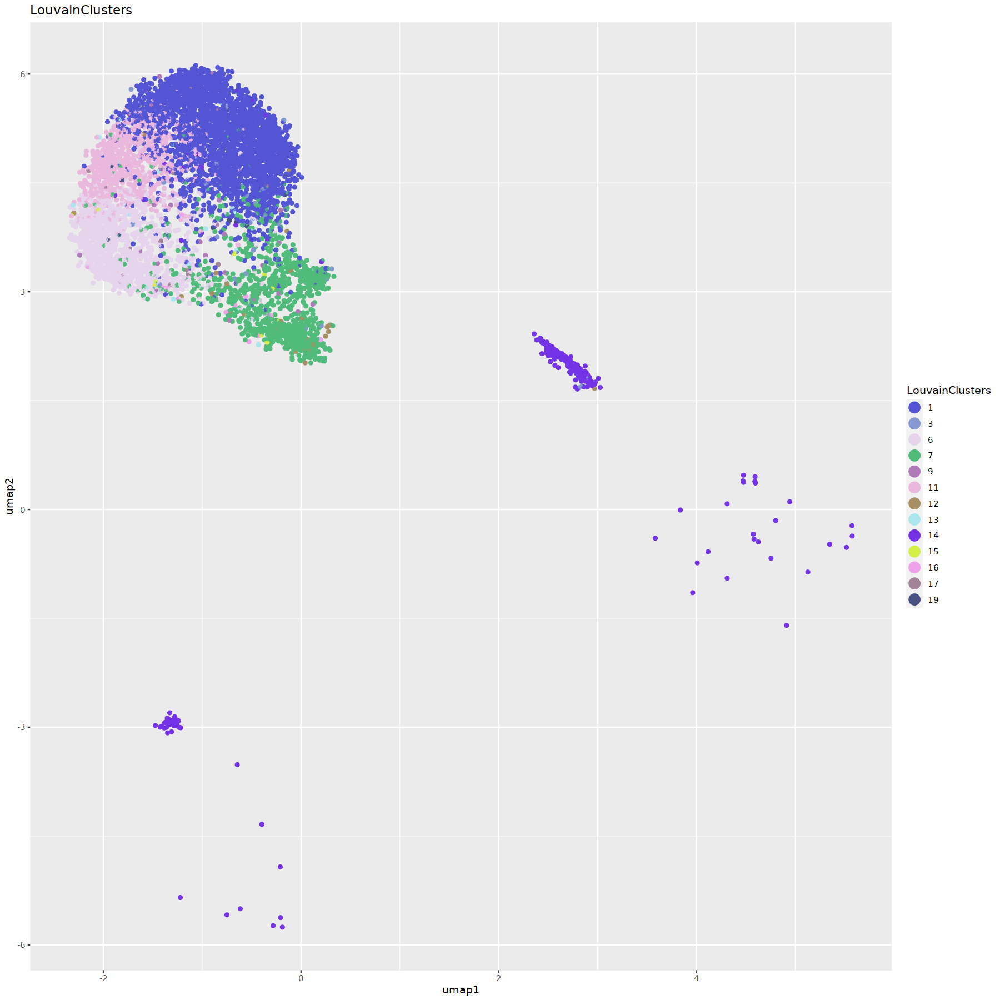

In [9]:
loaded_socrates_data$Clusters  %>% 
    group_by(LouvainClusters)  %>% 
    summarise(n())
    

v3.annot <- read.table("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_leaf.V3_final.txt", header = TRUE)  %>% 
    dplyr::select(cellID, V3_final_annnotation)

updated_meta_data <- left_join(loaded_socrates_data$Clusters, v3.annot, by = "cellID")

Zm.subcluster <- Zm.subcluster
Zm.subcluster$meta <- updated_meta_data

Zm.subcluster.epidermis <- Zm.subcluster
Zm.subcluster.epidermis$meta  %>% 
    dplyr::filter((umap2 > 1) | LouvainClusters == "14" )  %>% 
    ggplot(., aes(umap1, umap2, color = LouvainClusters)) + geom_point() +
 scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("LouvainClusters")

In [11]:
chosen_subcluster <- Zm.subcluster.epidermis$meta %>% 
    dplyr::filter((umap2 > 1) | LouvainClusters == "14" )

meta_df <- as.data.frame(chosen_subcluster)
rownames(meta_df) <- meta_df$cellID
Zm.subcluster.epidermis$meta <- meta_df
Zm.subcluster.epidermis$meta.v3 <- meta_df

Zm.subcluster.epidermis <- generateMatrix(Zm.subcluster.epidermis, 
                                              filtered=FALSE,
                                              peaks = FALSE,
                                              organelle_scaffolds= c("Pt", "Mt"),
                                                blacklist = "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/black_list_sc_ATAC/Zm.final_blaclist.final.bed",
                                              verbose=TRUE)

In [12]:
Zm.subcluster.epidermis <- convertSparseData(Zm.subcluster.epidermis, verbose = TRUE)

 - converting triplet format to sparseMatrix



In [17]:
# clean sparse counts matrix ---------------------------------------------
Zm.subcluster_epidermis.clean <- cleanData(Zm.subcluster.epidermis, 
                     min.c = 30,
                     min.t=0.01,  # minimum feature frequency across cells
                     max.t=0.3, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 6520 | peaks = 2053210

   * Filtered: cells = 6120 | peaks = 26078



In [20]:
# normalize with TFIDF ---------------------------------------------------
Zm.subcluster_epidermis.clean <- tfidf(Zm.subcluster_epidermis.clean)

# project with NMF -------------------------------------------------------
Zm.subcluster_epidermis.clean <- reduceDims(Zm.subcluster_epidermis.clean,
                      method="SVD", 
                      n.pcs=50, 
                      num.var=NULL,
                      doL2=TRUE,
                      svd_slotName="SVD")

# reduce to 2-dimensions with UMAP ---------------------------------------
Zm.subcluster_epidermis.clean <- projectUMAP(Zm.subcluster_epidermis.clean, 
                       verbose=T,
                       k.near=15,
                       m.dist=0.01,
                       svd_slotName="SVD")

library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

# identify clusters using neighborhood graph -----------------------------
Zm.subcluster_epidermis.clean.clusters <- callClusters(Zm.subcluster_epidermis.clean, 
                        res=2,
                        k.near = 30,
                        min.reads=500,
                        verbose=T,
                        svd_slotName= "SVD",
                        cluster_slotName="sub_cluster_epidermis",
                        cleanCluster=TRUE)

options(repr.plot.width=15, repr.plot.height=5)
old_clusters <- ggplot(Zm.subcluster_epidermis.clean$meta, aes(x=umap1, y = umap2, color = LouvainClusters)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

safe_LC <- Zm.subcluster_epidermis.clean.clusters$sub_cluster_epidermis   %>% 
    mutate(LouvainClusters.sub = str_c("LC", LouvainClusters, sep = "_"))


new_clusters <- ggplot(safe_LC, aes(x=umap1, y = umap2, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Updated L Clusters")


old_annotations <- ggplot(Zm.subcluster_epidermis.clean$meta, aes(x=umap1, y = umap2, color = V3_final_annnotation)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

 - non-linear dimensionality reduction with UMAP ...

12:32:03 UMAP embedding parameters a = 1.896 b = 0.8006

12:32:03 Read 6120 rows and found 49 numeric columns

12:32:03 Using Annoy for neighbor search, n_neighbors = 15

12:32:03 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:32:04 Writing NN index file to temp file /tmp/RtmpV553QF/file300fe45fdeee2

12:32:04 Searching Annoy index using 16 threads, search_k = 1500

12:32:04 Annoy recall = 100%

12:32:07 Commencing smooth kNN distance calibration using 16 threads
 with target n_neighbors = 15

12:32:11 Initializing from normalized Laplacian + noise (using irlba)

12:32:11 Commencing optimization for 500 epochs, with 115472 positive edges

12:32:32 Optimization finished

 - filtering outliers in UMAP manifold (z-

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6053
Number of edges: 136286

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.5500
Number of communities: 11
Elapsed time: 4 seconds


1 singletons identified. 10 final clusters.

 - finished graph-based clustering ...

   * removing low quality clusters ...

   * filtering per-cluster outliers (z-score filtDistClst2 = 5) ...

   * total number of cells surviving subcluster filtering = 6005

 - filtering clusters with low cell/read counts ...



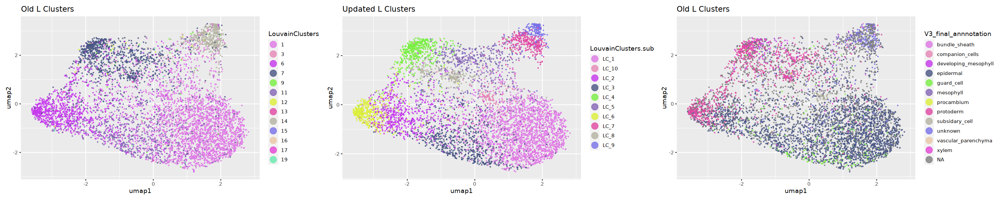

In [21]:
options(repr.plot.width=25, repr.plot.height=5)
old_clusters + new_clusters + old_annotations

In [22]:
Zm.subcluster_epidermis.clean.clusters$all_genes <- "/home/jpm73279/genome_downloads/Zmicolor.v5.1.prelim.annot/Zmicolorv5.1.gene.bed"
#bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm.all_mergeed_repds.unique.mpq10.tn5.sorted.bed"
genome_file <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM-5.0.fa.fai"
    
### Kernal Corrupted to just linked to the previosly run gene body accessability calculations
Zm.subcluster_epidermis.clean.clusters.counts <- Zm.subcluster_epidermis.clean.clusters
Zm.subcluster_epidermis.clean.clusters.counts$acr_counts_raw <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/zea_mays/clustering/Zm.gene_counts.output"

Zm.subcluster_epidermis.clean.clusters.counts$all_genes <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM_Zm00001eb.1.genes.bed"

## Execute Annotation Attempt #1
Zm.subcluster_epidermis.clean.clusters.final <- run_presto(Zm.subcluster_epidermis.clean.clusters.counts,
           meta_slot = "sub_cluster_epidermis",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

marker_list_maize_file <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/markers/Zm.Combined_total_markers.de_novo.AM.bed"
marker_list_maize <- read_delim(marker_list_maize_file, delim='\t', 
                                       col_names = TRUE)

grabbed_top_marker_per_cluster <- top_markers(Zm.subcluster_epidermis.clean.clusters.final$presto_marker, 500)
represented_marker_lst <- list()
for (i in unique(Zm.subcluster_epidermis.clean.clusters.final$sub_cluster_epidermis$LouvainClusters)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(grabbed_top_marker_per_cluster, 
                                           marker_list_maize, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    represented_marker_lst[[i]] <- markers_present_in_presto
}
                 
represented_marker_lst

# A tibble: 6 × 25
  cellID      total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg   tss_z
  <chr>       <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl> <dbl> <dbl>   <dbl>   <dbl>
1 BC:Z:GTTTC… 81977 11518 13790   308  40893    4.61 0.141 0.168 0.00376 -0.615 
2 BC:Z:GTGAA… 47875 15122 25089   154  23014    4.36 0.316 0.524 0.00322 -0.0243
3 BC:Z:GTGAA… 43219  6819  8482   234  22857    4.36 0.158 0.196 0.00541 -0.557 
4 BC:Z:GTGAA… 42200  7052  8484   106  22064    4.34 0.167 0.201 0.00251 -0.526 
5 BC:Z:GAGTG… 40907  5797  6634    60  21452    4.33 0.142 0.162 0.00147 -0.611 
6 BC:Z:GTGGC… 42265 16231 26310   167  19684    4.29 0.384 0.623 0.00395  0.205 
# … with 14 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>, and
#   abbreviated variable name ¹​log10nSites
# A tib

Rows: 370 Columns: 7
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): chr, start, end, geneID, name, type, tissue

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Warning message:
"Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(i)

  # Now:
  data %>% select(all_of(i))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>."


rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Zm00001eb084940,chr2,66223855,66236990,ba2,"axillary_meristem,branch_meristem,peripheral_zone_inflorescence_meristem,spikelet_pair_meristem,spikelet_meristem,upper_floral_meristem,lower_floral_meristem,pistil_primordia,stamen_primordia,provascular_strands,glume_primordia,lemma_primordia,palea_primordia",axillaryBud;leaf;tassel;ear
45,Zm00001eb206040,chr4,242141185,242145267,denovo.ID.AM.104,"ground_meristem,mesophyll,ground_meristem",leaf
81,Zm00001eb265000,chr6,32355223,32358690,denovo.ID.AM.126,"xylem,lignified_bundle_sheath",leaf
110,Zm00001eb296990,chr6,178052132,178057800,agp2,pith_parenchyma,axillaryBud;leaf;crownRoot;root;tassel;ear
128,Zm00001eb026490,chr1,121465669,121469876,ZmLAX2,"procambial_meristem,root_tip_epidermis,root_tip_pericycle,root_tip_endodermis",axillaryBud;leaf;crownRoot;root;tassel;ear
139,Zm00001eb092540,chr2,147040782,147041974,ssu2,bundle_sheath,axillaryBud;leaf
325,Zm00001eb001780,chr1,5281431,5285006,denovo.ID.AM.2,"rib_meristem_SAM,ground_meristem",leaf
345,Zm00001eb427470,chr10,135702002,135705078,zyb14,"leaf_primordia,leaf_tips",axillaryBud;leaf
387,Zm00001eb133930,chr3,105501727,105507931,sut2,"companion_cells,xylem_parenchyma,phloem_parenchyma,pith_parenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear


# A tibble: 6 × 25
  cellID      total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg   tss_z
  <chr>       <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl> <dbl> <dbl>   <dbl>   <dbl>
1 BC:Z:GTTTC… 81977 11518 13790   308  40893    4.61 0.141 0.168 0.00376 -0.615 
2 BC:Z:GTGAA… 47875 15122 25089   154  23014    4.36 0.316 0.524 0.00322 -0.0243
3 BC:Z:GTGAA… 43219  6819  8482   234  22857    4.36 0.158 0.196 0.00541 -0.557 
4 BC:Z:GTGAA… 42200  7052  8484   106  22064    4.34 0.167 0.201 0.00251 -0.526 
5 BC:Z:GAGTG… 40907  5797  6634    60  21452    4.33 0.142 0.162 0.00147 -0.611 
6 BC:Z:GTGGC… 42265 16231 26310   167  19684    4.29 0.384 0.623 0.00395  0.205 
# … with 14 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>, and
#   abbreviated variable name ¹​log10nSites


Rows: 22169188 Columns: 3
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): gene_name, barcode
dbl (1): accessability

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'LouvainClusters'. You can override using the `.groups` argument.


# A tibble: 6 × 4
# Groups:   LouvainClusters [1]
  LouvainClusters geneID          counts  value
  <fct>           <chr>            <dbl>  <dbl>
1 1               Zm00001eb000010     16  4.61 
2 1               Zm00001eb000020     16  4.61 
3 1               Zm00001eb000050      1  0.288
4 1               Zm00001eb000060     85 24.5  
5 1               Zm00001eb000070     35 10.1  
6 1               Zm00001eb000080    172 49.5  


Selecting by resid


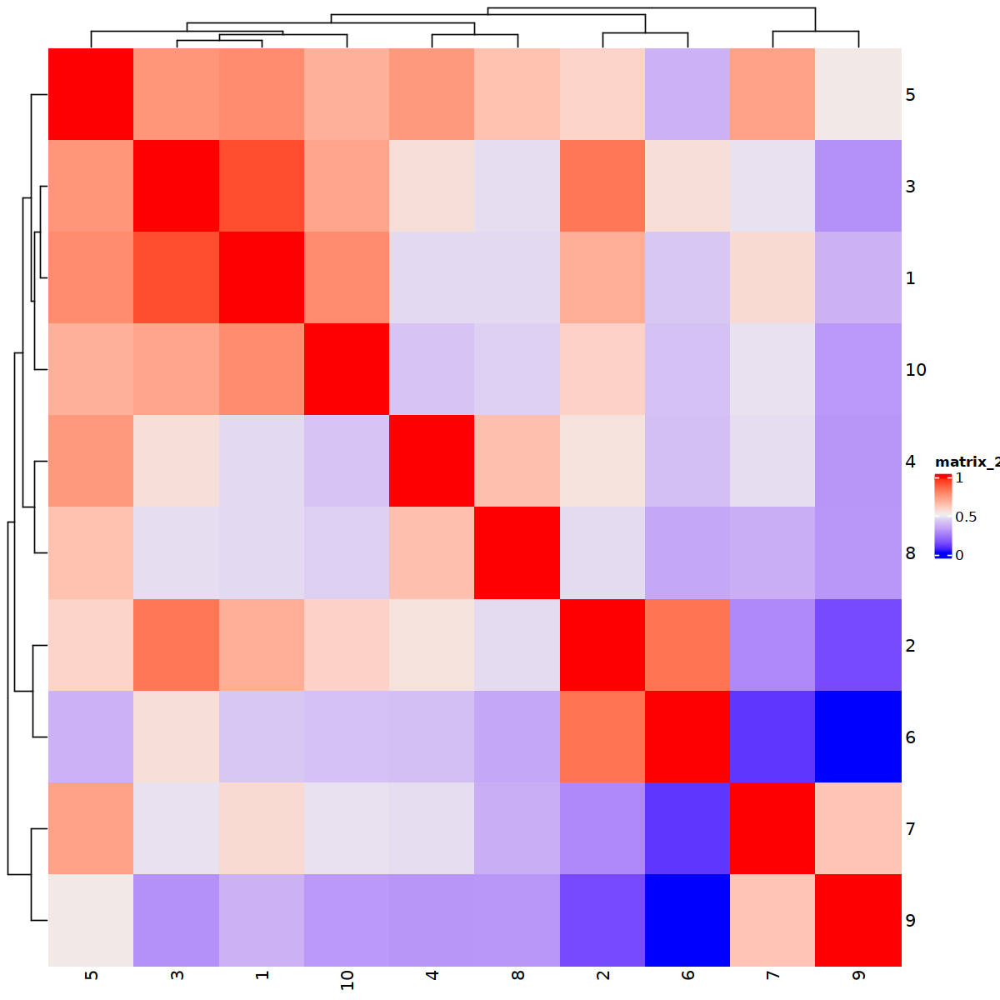

In [27]:
test <- marker_correlation(Zm.subcluster_epidermis.clean.clusters.counts,
           meta_slot = "sub_cluster_epidermis",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")


library(modelr)
combined_louvain_clusters <- as_tibble(test$corr_matrix) %>%
    pivot_longer(!geneID, names_to = "cluster_name", values_to = "score")  %>% 
    group_by(geneID)  %>% 
      summarize(mean = mean(score),
            var = var(score))

regression <- loess(var ~ mean, data=combined_louvain_clusters)

combined_louvain_clusters.final <- combined_louvain_clusters %>% 
    add_residuals(regression)  %>% 
    arrange(resid, desc = FALSE)  %>% 
    top_n(1000)


options(repr.plot.width=10, repr.plot.height=10)
corr_matrix <- test$corr_matrix

viz_matrix <- as_tibble(corr_matrix)  %>% 
    dplyr::filter(geneID %in% combined_louvain_clusters.final$geneID)  %>% 
    dplyr::select(-geneID)

Lc_corr_matrix <- cor(data.matrix(viz_matrix))

suppressPackageStartupMessages(library(ComplexHeatmap))
library(ComplexHeatmap)
Heatmap(Lc_corr_matrix)

In [25]:
Zm.subcluster_epidermis.clean.clusters.counts$sub_cluster_epidermis

,cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,cellbulk,is_cell,sampleID,umap1,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters,V3_final_annnotation
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>,<chr>
BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,81977,11518,13790,308,40893,4.611649,0.14050282,0.16821791,0.0037571514,⋯,0.07005970,1,rep1,-1.86783166,2.16037868,0.3369565,singlet,0.0037571514,4,NA
BC:Z:GTGAAAAGTCAAAAACAGTAGAGACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAAGTCAAAAACAGTAGAGACTAA-Zm_rep1_P4_10x.rep1,47875,15122,25089,154,23014,4.361992,0.31586423,0.52405222,0.0032167102,⋯,0.11849124,1,rep1,-0.36157895,1.88609432,0.5434783,singlet,0.0032167102,5,protoderm
BC:Z:GTGAAACCGTCCGTAGTGTGGCCACCGG-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAACCGTCCGTAGTGTGGCCACCGG-Zm_rep1_P4_10x.rep1,43219,6819,8482,234,22857,4.359019,0.15777783,0.19625628,0.0054142854,⋯,0.07042254,1,rep1,2.19580047,-1.34906651,0.2934783,singlet,0.0054142854,1,NA
BC:Z:GTGAAACCGTCCTAAGAATTCCTTCGGA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAACCGTCCTAAGAATTCCTTCGGA-Zm_rep1_P4_10x.rep1,42200,7052,8484,106,22064,4.343684,0.16710900,0.20104265,0.0025118483,⋯,0.06103171,1,rep1,0.50966834,-0.86253347,0.3369565,singlet,0.0025118483,10,NA
BC:Z:GAGTGGCTTGTAATACGATTCCTCGAGG-Zm_rep1_P8_10x.rep1,BC:Z:GAGTGGCTTGTAATACGATTCCTCGAGG-Zm_rep1_P8_10x.rep1,40907,5797,6634,60,21452,4.331468,0.14171169,0.16217273,0.0014667416,⋯,0.04302180,1,rep1,1.72563748,0.42689608,0.3695652,singlet,0.0014667416,1,NA
BC:Z:GTGGCCGATCAGTAAGAGTGGCCTCGGA-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCGATCAGTAAGAGTGGCCTCGGA-Zm_rep1_P5_10x.rep1,42265,16231,26310,167,19684,4.294113,0.38402934,0.62250089,0.0039512599,⋯,0.12726142,1,rep1,1.02068691,2.53048705,0.3913043,singlet,0.0039512599,7,NA
BC:Z:GTGAAACTTGTAAGCGAGTCCGCCGAGG-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAACTTGTAAGCGAGTCCGCCGAGG-Zm_rep1_P4_10x.rep1,40771,17612,28562,87,18227,4.260715,0.43197371,0.70054696,0.0021338697,⋯,0.12674898,1,rep1,-0.42743011,0.10003672,0.5434783,singlet,0.0021338697,9,unknown
BC:Z:GTGGCCGGCTACGACTTACTGATGATGA-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCGGCTACGACTTACTGATGATGA-Zm_rep1_P5_10x.rep1,33483,2995,3003,96,17916,4.253241,0.08944838,0.08968730,0.0028671266,⋯,0.02935752,1,rep1,-2.87150343,-0.81397195,0.3695652,singlet,0.0028671266,2,NA
BC:Z:GTTTCGCCGTCCAGCGAGTAGAGAGCTT-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGCCGTCCAGCGAGTAGAGAGCTT-Zm_rep1_P6_10x.rep1,34233,15314,25190,184,15447,4.188844,0.44734613,0.73583969,0.0053749306,⋯,0.12703601,1,rep1,1.72475498,3.13402675,0.3260870,singlet,0.0053749306,9,unknown


In [26]:
write_delim(Zm.subcluster_epidermis.clean.clusters.counts$sub_cluster_epidermis, "/scratch/jpm73279/comparative_single_cell/quick_visualize/Zm.epidermal_subclustering_meta.txt",
                       col_names = TRUE, quote = "none", delim = "\t")

In [30]:
Zm.epidermis_sub_annot <- Zm.subcluster_epidermis.clean.clusters.counts$sub_cluster_epidermis %>% 
    dplyr::mutate(Zm.epidermis_lc = str_c("LC", LouvainClusters, sep = "_")) %>%     
    dplyr::mutate(Zm_v4_annot.subcluster_annot = NA)  %>% 
    dplyr::mutate(Zm_v4_annot.subcluster_annot = case_when(Zm.epidermis_lc %in% c("LC_1") ~ "epidermis",
        Zm.epidermis_lc %in% c("LC_2") ~ "protoderm",                                                                                                                    
        Zm.epidermis_lc %in% c("LC_3") ~ "epidermis",        
        Zm.epidermis_lc %in% c("LC_4") ~ "protoderm",                                                                                                                    
        Zm.epidermis_lc %in% c("LC_5") ~ "epidermis",
        Zm.epidermis_lc %in% c("LC_6") ~ "protoderm",                                                                                                                    
        Zm.epidermis_lc %in% c("LC_7") ~ "subsidiary_mother_cells",
        Zm.epidermis_lc %in% c("LC_8") ~ "subsidiary_cells",                                                                                                                    
        Zm.epidermis_lc %in% c("LC_9") ~ "stomatal_precursor",
        Zm.epidermis_lc %in% c("LC_10") ~ "subsidiary_cells",                                                                                                                   
        TRUE ~ "unknown_clusters"))

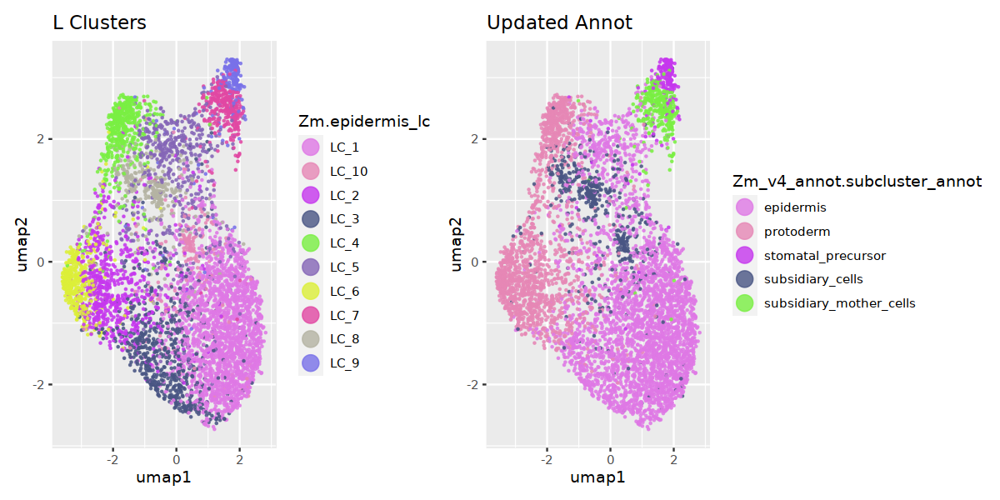

In [31]:
options(repr.plot.width=10, repr.plot.height=5)
LC_vasc <- ggplot(Zm.epidermis_sub_annot, aes(x=umap1, y = umap2, color = Zm.epidermis_lc)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

vasc_annot <- ggplot(Zm.epidermis_sub_annot, aes(x=umap1, y = umap2, color = Zm_v4_annot.subcluster_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Annot")

LC_vasc + vasc_annot


Attaching package: 'patchwork'


The following object is masked from 'package:cowplot':

    align_plots


The following object is masked from 'package:MASS':

    area




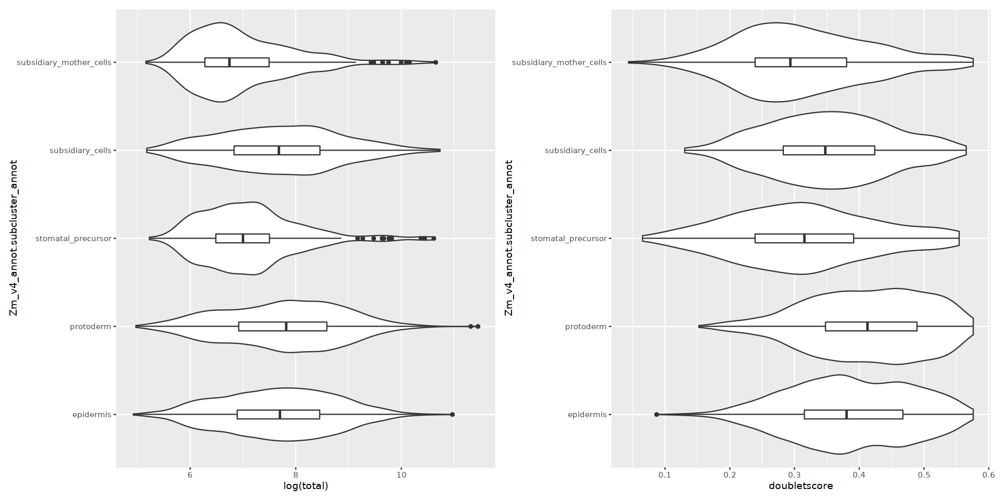

In [32]:
library(patchwork)
options(repr.plot.width=16, repr.plot.height=8)
total_tn5 <- ggplot(Zm.epidermis_sub_annot, aes(x = Zm_v4_annot.subcluster_annot, y = log(total))) + 
    geom_violin() + 
    geom_boxplot(width = .1) +
      coord_flip()


doublet_score <- ggplot(Zm.epidermis_sub_annot, aes(x = Zm_v4_annot.subcluster_annot, y = doubletscore)) + 
    geom_violin() + 
    geom_boxplot(width = .1) +
      coord_flip()


total_tn5 + doublet_score


In [38]:
Zm.v4_annot.vasc <- read_delim("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.updated_vasc_subclustering.txt")

Rows: 26904 Columns: 27
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (6): cellID, sampleID, d.type, Zm_v4_annot, Zm_v4_annot.subcluster_anno...
dbl (21): total, tss, acrs, ptmt, nSites, log10nSites, pTSS, FRiP, pOrg, tss...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [40]:
colnames(Zm.v4_annot.vasc)

[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm_v4_annot"                  "Zm_v4_annot.subcluster_annot"
[27] "Zm.vasculature_lc"

In [41]:
Zm.epidermis_sub_annot

,cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,sampleID,umap1,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters,V3_final_annnotation,Zm.epidermis_lc,Zm_v4_annot.subcluster_annot
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>,<chr>,<chr>,<chr>
BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,81977,11518,13790,308,40893,4.611649,0.14050282,0.16821791,0.0037571514,⋯,rep1,-1.86783166,2.16037868,0.3369565,singlet,0.0037571514,4,NA,LC_4,protoderm
BC:Z:GTGAAAAGTCAAAAACAGTAGAGACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAAGTCAAAAACAGTAGAGACTAA-Zm_rep1_P4_10x.rep1,47875,15122,25089,154,23014,4.361992,0.31586423,0.52405222,0.0032167102,⋯,rep1,-0.36157895,1.88609432,0.5434783,singlet,0.0032167102,5,protoderm,LC_5,epidermis
BC:Z:GTGAAACCGTCCGTAGTGTGGCCACCGG-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAACCGTCCGTAGTGTGGCCACCGG-Zm_rep1_P4_10x.rep1,43219,6819,8482,234,22857,4.359019,0.15777783,0.19625628,0.0054142854,⋯,rep1,2.19580047,-1.34906651,0.2934783,singlet,0.0054142854,1,NA,LC_1,epidermis
BC:Z:GTGAAACCGTCCTAAGAATTCCTTCGGA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAACCGTCCTAAGAATTCCTTCGGA-Zm_rep1_P4_10x.rep1,42200,7052,8484,106,22064,4.343684,0.16710900,0.20104265,0.0025118483,⋯,rep1,0.50966834,-0.86253347,0.3369565,singlet,0.0025118483,10,NA,LC_10,subsidiary_cells
BC:Z:GAGTGGCTTGTAATACGATTCCTCGAGG-Zm_rep1_P8_10x.rep1,BC:Z:GAGTGGCTTGTAATACGATTCCTCGAGG-Zm_rep1_P8_10x.rep1,40907,5797,6634,60,21452,4.331468,0.14171169,0.16217273,0.0014667416,⋯,rep1,1.72563748,0.42689608,0.3695652,singlet,0.0014667416,1,NA,LC_1,epidermis
BC:Z:GTGGCCGATCAGTAAGAGTGGCCTCGGA-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCGATCAGTAAGAGTGGCCTCGGA-Zm_rep1_P5_10x.rep1,42265,16231,26310,167,19684,4.294113,0.38402934,0.62250089,0.0039512599,⋯,rep1,1.02068691,2.53048705,0.3913043,singlet,0.0039512599,7,NA,LC_7,subsidiary_mother_cells
BC:Z:GTGAAACTTGTAAGCGAGTCCGCCGAGG-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAACTTGTAAGCGAGTCCGCCGAGG-Zm_rep1_P4_10x.rep1,40771,17612,28562,87,18227,4.260715,0.43197371,0.70054696,0.0021338697,⋯,rep1,-0.42743011,0.10003672,0.5434783,singlet,0.0021338697,9,unknown,LC_9,stomatal_precursor
BC:Z:GTGGCCGGCTACGACTTACTGATGATGA-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCGGCTACGACTTACTGATGATGA-Zm_rep1_P5_10x.rep1,33483,2995,3003,96,17916,4.253241,0.08944838,0.08968730,0.0028671266,⋯,rep1,-2.87150343,-0.81397195,0.3695652,singlet,0.0028671266,2,NA,LC_2,protoderm
BC:Z:GTTTCGCCGTCCAGCGAGTAGAGAGCTT-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGCCGTCCAGCGAGTAGAGAGCTT-Zm_rep1_P6_10x.rep1,34233,15314,25190,184,15447,4.188844,0.44734613,0.73583969,0.0053749306,⋯,rep1,1.72475498,3.13402675,0.3260870,singlet,0.0053749306,9,unknown,LC_9,stomatal_precursor


In [48]:
str(Zm.epidermis_sub_annot)

'data.frame':	6005 obs. of  27 variables:
 $ cellID                      : chr  "BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1" "BC:Z:GTGAAAAGTCAAAAACAGTAGAGACTAA-Zm_rep1_P4_10x.rep1" "BC:Z:GTGAAACCGTCCGTAGTGTGGCCACCGG-Zm_rep1_P4_10x.rep1" "BC:Z:GTGAAACCGTCCTAAGAATTCCTTCGGA-Zm_rep1_P4_10x.rep1" ...
 $ total                       : num  81977 47875 43219 42200 40907 ...
 $ tss                         : num  11518 15122 6819 7052 5797 ...
 $ acrs                        : num  13790 25089 8482 8484 6634 ...
 $ ptmt                        : num  308 154 234 106 60 167 87 96 184 206 ...
 $ nSites                      : num  40893 23014 22857 22064 21452 ...
 $ log10nSites                 : num  4.61 4.36 4.36 4.34 4.33 ...
 $ pTSS                        : num  0.141 0.316 0.158 0.167 0.142 ...
 $ FRiP                        : num  0.168 0.524 0.196 0.201 0.162 ...
 $ pOrg                        : num  0.00376 0.00322 0.00541 0.00251 0.00147 ...
 $ tss_z                       : num  

In [42]:
Zm.subcluster_vasc_updated_annotations <- Zm.epidermis_sub_annot  %>% 
    dplyr::mutate(Zm_v4_annot = Zm_v4_annot.subcluster_annot)  %>% 
    mutate(across(c(LouvainClusters),factor))  %>% 
    dplyr::select(cellID, Zm_v4_annot, Zm_v4_annot.subcluster_annot, Zm.epidermis_lc)

In [51]:
colnames(Zm.v4_annot.vasc)

[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm_v4_annot"                  "Zm_v4_annot.subcluster_annot"
[27] "Zm.vasculature_lc"

In [54]:
Zm.subcluster_epidermis.final_meta <- Zm.v4_annot.vasc  %>% 
    dplyr::select(-Zm_v4_annot, -Zm_v4_annot.subcluster_annot)  %>% 
    dplyr::filter(cellID %in% Zm.epidermis_sub_annot$cellID)  %>% 
    left_join(., Zm.subcluster_vasc_updated_annotations, by = "cellID")  %>% 
    mutate(across(c(LouvainClusters),factor))
    

In [55]:
Zm.subcluster_epidermis.final_meta

cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,umap1,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters,Zm.vasculature_lc,Zm_v4_annot,Zm_v4_annot.subcluster_annot,Zm.epidermis_lc
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>
BC:Z:GTTTCGATGTCAAGCGAGTCCGCACCGG-Zm_rep1_P6_10x.rep1,81977,11518,13790,308,56566,4.752555,0.14050282,0.16821791,0.0037571514,⋯,-0.04450613,2.279400,0.3369565,singlet,0.0037571514,7,NA,protoderm,protoderm,LC_4
BC:Z:GTGAAAAGTCAAAAACAGTAGAGACTAA-Zm_rep1_P4_10x.rep1,47875,15122,25089,154,31875,4.503450,0.31586423,0.52405222,0.0032167102,⋯,0.15819527,3.228223,0.5434783,singlet,0.0032167102,7,NA,epidermis,epidermis,LC_5
BC:Z:GTGAAACCGTCCGTAGTGTGGCCACCGG-Zm_rep1_P4_10x.rep1,43219,6819,8482,234,30782,4.488297,0.15777783,0.19625628,0.0054142854,⋯,-0.75327598,5.265699,0.2934783,singlet,0.0054142854,1,NA,epidermis,epidermis,LC_1
BC:Z:GTGAAACCGTCCTAAGAATTCCTTCGGA-Zm_rep1_P4_10x.rep1,42200,7052,8484,106,29893,4.475570,0.16710900,0.20104265,0.0025118483,⋯,-0.54601245,5.041676,0.3369565,singlet,0.0025118483,1,NA,subsidiary_cells,subsidiary_cells,LC_10
BC:Z:GAGTGGCTTGTAATACGATTCCTCGAGG-Zm_rep1_P8_10x.rep1,40907,5797,6634,60,29585,4.471072,0.14171169,0.16217273,0.0014667416,⋯,-0.15973999,5.273506,0.3695652,singlet,0.0014667416,1,NA,epidermis,epidermis,LC_1
BC:Z:GTGGCCGATCAGTAAGAGTGGCCTCGGA-Zm_rep1_P5_10x.rep1,42265,16231,26310,167,27823,4.444404,0.38402934,0.62250089,0.0039512599,⋯,-1.85030388,4.742117,0.3913043,singlet,0.0039512599,1,NA,subsidiary_mother_cells,subsidiary_mother_cells,LC_7
BC:Z:GTGAAACTTGTAAGCGAGTCCGCCGAGG-Zm_rep1_P4_10x.rep1,40771,17612,28562,87,25848,4.412427,0.43197371,0.70054696,0.0021338697,⋯,-2.23262893,4.494734,0.5434783,singlet,0.0021338697,11,NA,stomatal_precursor,stomatal_precursor,LC_9
BC:Z:GTGGCCGGCTACGACTTACTGATGATGA-Zm_rep1_P5_10x.rep1,33483,2995,3003,96,24418,4.387710,0.08944838,0.08968730,0.0028671266,⋯,-1.90645718,3.615330,0.3695652,singlet,0.0028671266,6,NA,protoderm,protoderm,LC_2
BC:Z:GTTTCGCCGTCCAGCGAGTAGAGAGCTT-Zm_rep1_P6_10x.rep1,34233,15314,25190,184,21921,4.340860,0.44734613,0.73583969,0.0053749306,⋯,-2.22150408,4.227425,0.3260870,singlet,0.0053749306,6,NA,stomatal_precursor,stomatal_precursor,LC_9


[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm.vasculature_lc"            "Zm_v4_annot"                 
[27] "Zm_v4_annot.subcluster_annot" "Zm.epidermis_lc"

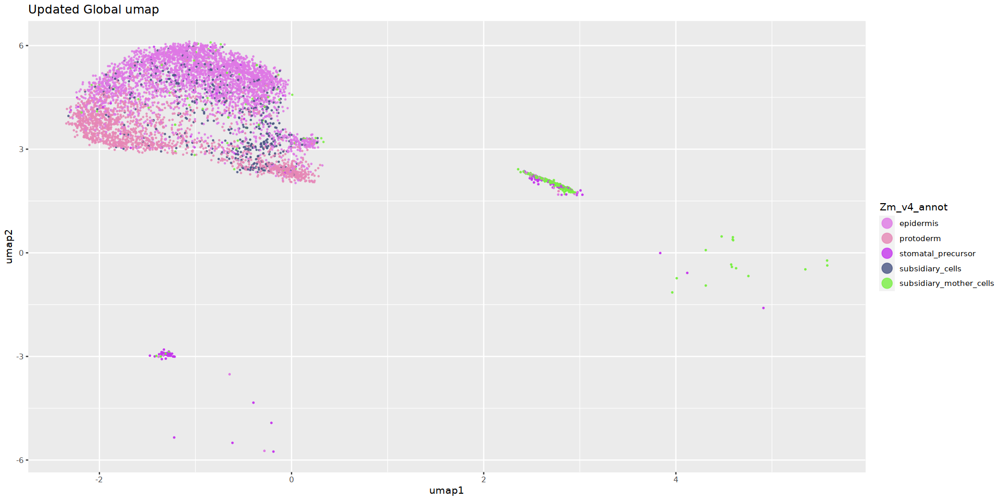

In [56]:
colnames(Zm.subcluster_epidermis.final_meta)

global_umap_only_epidermis <- ggplot(Zm.subcluster_epidermis.final_meta, aes(x=umap1, y = umap2, color = Zm_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Global umap")

global_umap_only_epidermis

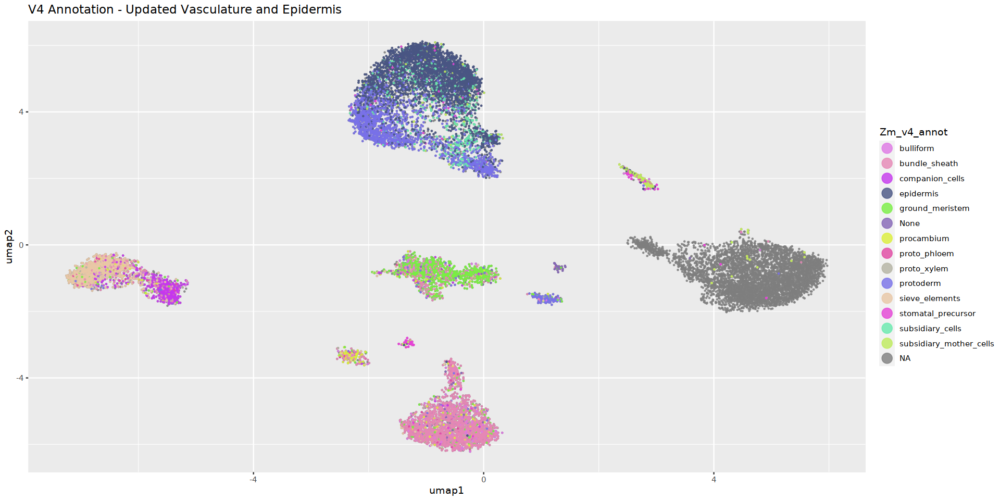

In [58]:
`%ni%` <- Negate(`%in%`)

v4_annot_filtered_cells <- Zm.v4_annot.vasc %>% 
    dplyr::filter(cellID %ni% Zm.subcluster_epidermis.final_meta)  %>% 
      mutate(across(c(LouvainClusters),factor))


Zm.combined_vasc <- bind_rows(v4_annot_filtered_cells, Zm.subcluster_epidermis.final_meta)

updated_meso_annot_global <- ggplot(Zm.combined_vasc, aes(x=umap1, y = umap2, color = Zm_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("V4 Annotation - Updated Vasculature and Epidermis")

updated_meso_annot_global

In [63]:
colnames(Zm.epidermis_sub_annot)

[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "V3_final_annnotation"         "Zm.epidermis_lc"             
[27] "Zm_v4_annot.subcluster_annot"

In [65]:
Zm.subcluster_epidermis.clean.clusters.final$final_epidermis_annotation <- Zm.epidermis_sub_annot
Zm.subcluster_epidermis.clean.clusters.final <- run_presto(Zm.subcluster_epidermis.clean.clusters.final,
           meta_slot = "final_epidermis_annotation",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot.subcluster_annot")



epidermis_sub_annot.top_markers <- top_markers(Zm.subcluster_epidermis.clean.clusters.final$presto_marker, 200)

epidermis_v1.sub_marker_list <- list()
for (i in unique(Zm.subcluster_epidermis.clean.clusters.final$final_epidermis_annotation$Zm_v4_annot)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(epidermis_sub_annot.top_markers, 
                                           marker_list_maize, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    epidermis_v1.sub_marker_list[[i]] <- markers_present_in_presto
}
                 
epidermis_v1.sub_marker_list

# A tibble: 6 × 27
  cellID      total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg   tss_z
  <chr>       <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl> <dbl> <dbl>   <dbl>   <dbl>
1 BC:Z:GTTTC… 81977 11518 13790   308  40893    4.61 0.141 0.168 0.00376 -0.615 
2 BC:Z:GTGAA… 47875 15122 25089   154  23014    4.36 0.316 0.524 0.00322 -0.0243
3 BC:Z:GTGAA… 43219  6819  8482   234  22857    4.36 0.158 0.196 0.00541 -0.557 
4 BC:Z:GTGAA… 42200  7052  8484   106  22064    4.34 0.167 0.201 0.00251 -0.526 
5 BC:Z:GAGTG… 40907  5797  6634    60  21452    4.33 0.142 0.162 0.00147 -0.611 
6 BC:Z:GTGGC… 42265 16231 26310   167  19684    4.29 0.384 0.623 0.00395  0.205 
# … with 16 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>,
#   Zm.epidermis_lc <chr>, Zm_v4_annot.subcluster_annot

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
4,Zm00001eb084940,chr2,66223855,66236990,ba2,"axillary_meristem,branch_meristem,peripheral_zone_inflorescence_meristem,spikelet_pair_meristem,spikelet_meristem,upper_floral_meristem,lower_floral_meristem,pistil_primordia,stamen_primordia,provascular_strands,glume_primordia,lemma_primordia,palea_primordia",axillaryBud;leaf;tassel;ear
24,Zm00001eb313510,chr7,123684235,123693464,gl1,epidermis,axillaryBud;leaf;crownRoot;root
166,Zm00001eb303810,chr7,22872338,22883538,SID1,"spikelet_pair_meristem,spikelet_meristem,pistil_primordia,stamen_primordia,lower_flora",axillaryBud;leaf;tassel;ear
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
92,Zm00001eb050790,chr1,258566321,258579264,bhlh43,bundle_sheath,axillaryBud;leaf
94,Zm00001eb359190,chr8,150377960,150388567,cah6,mesophyll,axillaryBud;leaf
105,Zm00001eb195270,chr4,189546416,189552160,denovo.ID.AM.100,"xylem_parenchyma,companion_cell",leaf
164,Zm00001eb012270,chr1,40006278,40008645,denovo.ID.AM.12,"ground_meristem,mesophyll,undifferentiate_parenchyma",leaf


In [66]:
Zm.subcluster_epidermis.clean.clusters.final <- marker_correlation(Zm.subcluster_epidermis.clean.clusters.final,
           meta_slot = "final_epidermis_annotation",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot.subcluster_annot")

# A tibble: 6 × 27
  cellID      total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg   tss_z
  <chr>       <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl> <dbl> <dbl>   <dbl>   <dbl>
1 BC:Z:GTTTC… 81977 11518 13790   308  40893    4.61 0.141 0.168 0.00376 -0.615 
2 BC:Z:GTGAA… 47875 15122 25089   154  23014    4.36 0.316 0.524 0.00322 -0.0243
3 BC:Z:GTGAA… 43219  6819  8482   234  22857    4.36 0.158 0.196 0.00541 -0.557 
4 BC:Z:GTGAA… 42200  7052  8484   106  22064    4.34 0.167 0.201 0.00251 -0.526 
5 BC:Z:GAGTG… 40907  5797  6634    60  21452    4.33 0.142 0.162 0.00147 -0.611 
6 BC:Z:GTGGC… 42265 16231 26310   167  19684    4.29 0.384 0.623 0.00395  0.205 
# … with 16 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>,
#   Zm.epidermis_lc <chr>, Zm_v4_annot.subcluster_annot

Rows: 22169188 Columns: 3
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): gene_name, barcode
dbl (1): accessability

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'Zm_v4_annot.subcluster_annot'. You can override using the `.groups` argument.


# A tibble: 6 × 4
# Groups:   Zm_v4_annot.subcluster_annot [1]
  Zm_v4_annot.subcluster_annot geneID          counts  value
  <chr>                        <chr>            <dbl>  <dbl>
1 epidermis                    Zm00001eb000010     38  6.57 
2 epidermis                    Zm00001eb000020     36  6.22 
3 epidermis                    Zm00001eb000050      5  0.864
4 epidermis                    Zm00001eb000060    156 27.0  
5 epidermis                    Zm00001eb000070     62 10.7  
6 epidermis                    Zm00001eb000080    258 44.6  


Selecting by resid


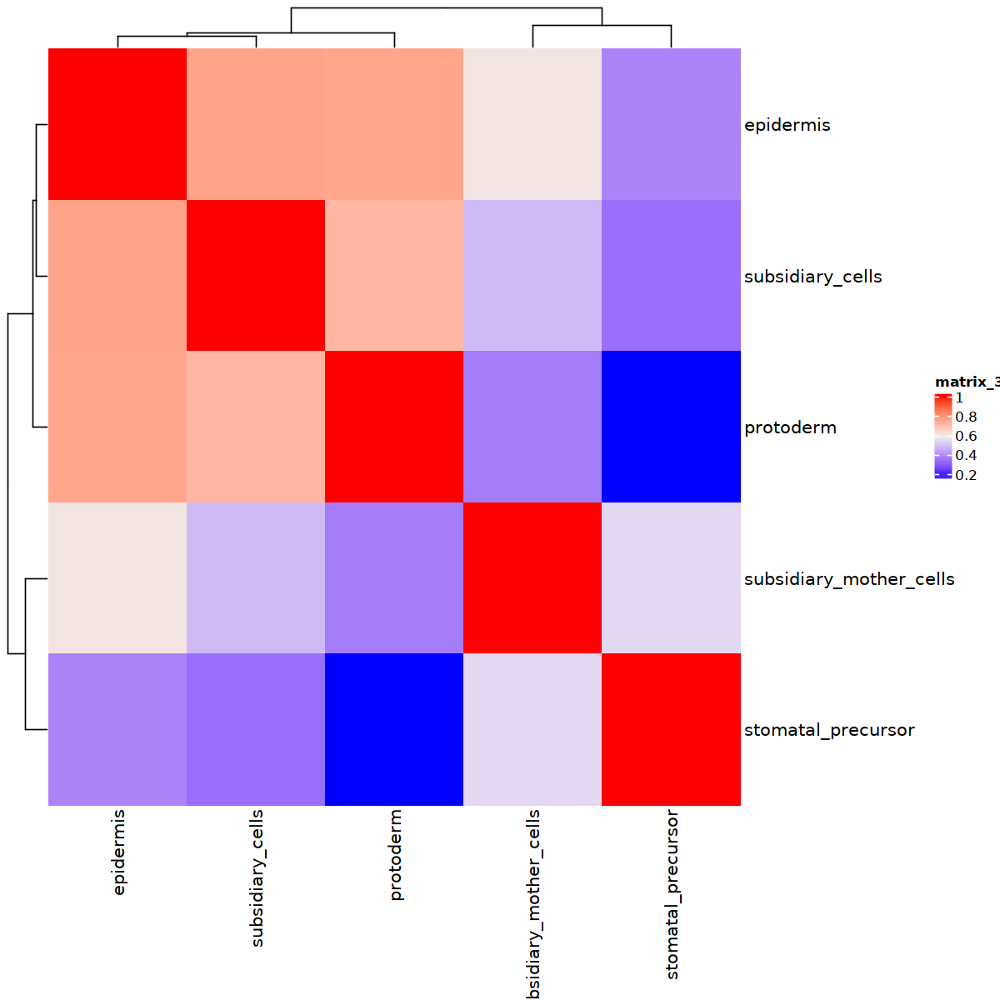

In [67]:
library(modelr)
combined_louvain_clusters <- as_tibble(Zm.subcluster_epidermis.clean.clusters.final$corr_matrix) %>%
    pivot_longer(!geneID, names_to = "cluster_name", values_to = "score")  %>% 
    group_by(geneID)  %>% 
      summarize(mean = mean(score),
            var = var(score))

regression <- loess(var ~ mean, data=combined_louvain_clusters)

combined_louvain_clusters.final <- combined_louvain_clusters %>% 
    add_residuals(regression)  %>% 
    arrange(resid, desc = FALSE)  %>% 
    top_n(800)

options(repr.plot.width=10, repr.plot.height=10)
corr_matrix <- Zm.subcluster_epidermis.clean.clusters.final$corr_matrix

viz_matrix <- as_tibble(corr_matrix)  %>% 
    dplyr::filter(geneID %in% combined_louvain_clusters.final$geneID)  %>% 
    dplyr::select(-geneID)

Lc_corr_matrix <- cor(data.matrix(viz_matrix))

suppressPackageStartupMessages(library(ComplexHeatmap))
library(ComplexHeatmap)
Heatmap(Lc_corr_matrix)

In [68]:
write_delim(Zm.combined_vasc, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.updated_epidermis.updated_vasculature_subclustering.txt",
                       col_names = TRUE, quote = "none", delim = "\t")

# SubClustering Mesophyll Lineage

LouvainClusters,n()
<fct>,<int>
1,2880
2,2477
3,2053
4,1596
5,1186
6,1134
7,1097
8,1118
9,906


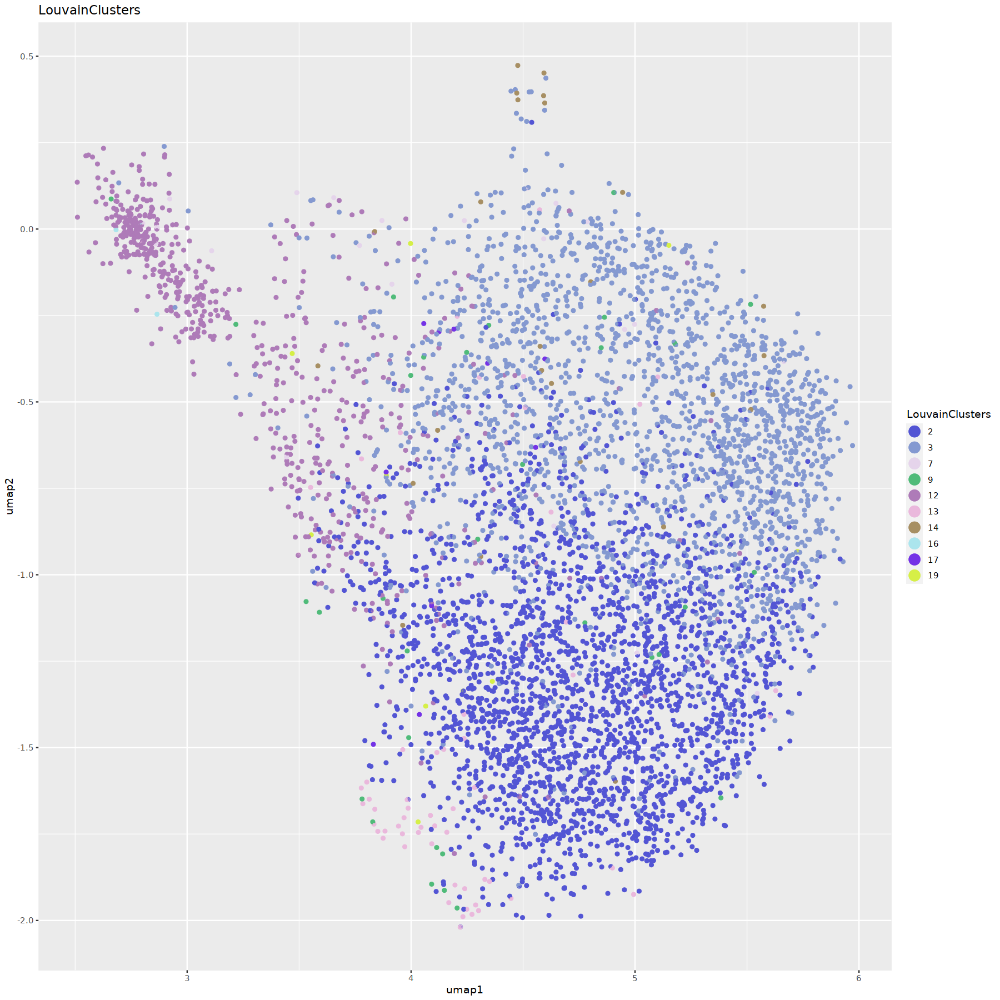

In [6]:
loaded_socrates_data$Clusters  %>% 
    group_by(LouvainClusters)  %>% 
    summarise(n())
    

v3.annot <- read.table("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_leaf.V3_final.txt", header = TRUE)  %>% 
    dplyr::select(cellID, V3_final_annnotation)

updated_meta_data <- left_join(loaded_socrates_data$Clusters, v3.annot, by = "cellID")

Zm.subcluster <- Zm.subcluster
Zm.subcluster$meta <- updated_meta_data

Zm.subcluster.mesophyll <- Zm.subcluster
Zm.subcluster.mesophyll$meta  %>% 
    dplyr::filter((umap2 < 1) & umap1 > 2.5)  %>% 
    ggplot(., aes(umap1, umap2, color = LouvainClusters)) + geom_point() +
 scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("LouvainClusters")

chosen_subcluster <- Zm.subcluster.mesophyll$meta %>% 
    dplyr::filter((umap2 < 1) & umap1 > 2.5)

In [7]:
meta_df <- as.data.frame(chosen_subcluster)
rownames(meta_df) <- meta_df$cellID
Zm.subcluster.mesophyll$meta <- meta_df
Zm.subcluster.mesophyll$meta.v3 <- meta_df

Zm.subcluster.mesophyll <- generateMatrix(Zm.subcluster.mesophyll, 
                                              filtered=FALSE,
                                              peaks = FALSE,
                                              organelle_scaffolds= c("Pt", "Mt"),
                                                blacklist = "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/black_list_sc_ATAC/Zm.final_blaclist.final.bed",
                                              verbose=TRUE)

Zm.subcluster.mesophyll <- convertSparseData(Zm.subcluster.mesophyll, verbose = TRUE)

 - converting triplet format to sparseMatrix



In [8]:
# clean sparse counts matrix ---------------------------------------------
Zm.subcluster_mesophyll.clean <- cleanData(Zm.subcluster.mesophyll, 
                     min.c = 30,
                     min.t=0.01,  # minimum feature frequency across cells
                     max.t=0.3, # maximum feature frequency across cells
                     verbose=T)

   * Input: cells = 5293 | peaks = 2053210

   * Filtered: cells = 4951 | peaks = 22758



 - non-linear dimensionality reduction with UMAP ...

10:24:42 UMAP embedding parameters a = 1.896 b = 0.8006

10:24:42 Read 4951 rows and found 49 numeric columns

10:24:42 Using Annoy for neighbor search, n_neighbors = 15

10:24:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:24:42 Writing NN index file to temp file /tmp/RtmpQWKgDD/file3255d731d2d54

10:24:42 Searching Annoy index using 16 threads, search_k = 1500

10:24:42 Annoy recall = 100%

10:24:46 Commencing smooth kNN distance calibration using 16 threads
 with target n_neighbors = 15

10:24:49 Initializing from normalized Laplacian + noise (using irlba)

10:24:50 Commencing optimization for 500 epochs, with 83468 positive edges

10:25:07 Optimization finished

 - filtering outliers in UMAP manifold (z-s

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4868
Number of edges: 48168

Running Louvain algorithm...
Maximum modularity in 100 random starts: 0.5625
Number of communities: 3
Elapsed time: 1 seconds


 - finished graph-based clustering ...

   * removing low quality clusters ...

   * filtering per-cluster outliers (z-score filtDistClst2 = 5) ...

   * total number of cells surviving subcluster filtering = 4848

 - filtering clusters with low cell/read counts ...



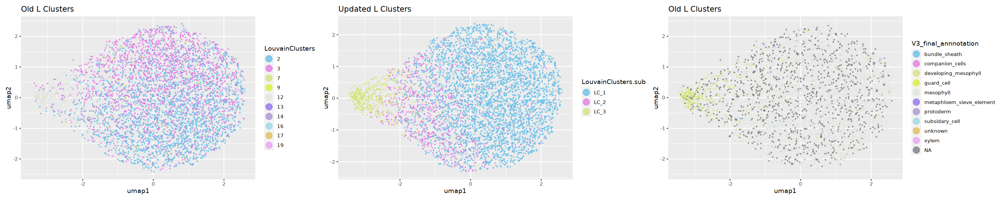

In [9]:
# normalize with TFIDF ---------------------------------------------------
Zm.subcluster_mesophyll.clean <- tfidf(Zm.subcluster_mesophyll.clean)

# project with NMF -------------------------------------------------------
Zm.subcluster_mesophyll.clean <- reduceDims(Zm.subcluster_mesophyll.clean,
                      method="SVD", 
                      n.pcs=50, 
                      num.var=NULL,
                      doL2=TRUE,
                      svd_slotName="SVD")

# reduce to 2-dimensions with UMAP ---------------------------------------
Zm.subcluster_mesophyll.clean <- projectUMAP(Zm.subcluster_mesophyll.clean, 
                       verbose=T,
                       k.near=15,
                       m.dist=0.01,
                       svd_slotName="SVD")

library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

# identify clusters using neighborhood graph -----------------------------
Zm.subcluster_mesophyll.clean.clusters <- callClusters(Zm.subcluster_mesophyll.clean, 
                        res=.75,
                        k.near = 30,
                        min.reads=500,
                        verbose=T,
                        svd_slotName= "SVD",
                        cluster_slotName="sub_cluster_mesophyll",
                        cleanCluster=TRUE)

options(repr.plot.width=15, repr.plot.height=5)
old_clusters <- ggplot(Zm.subcluster_mesophyll.clean$meta, aes(x=umap1, y = umap2, color = LouvainClusters)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

safe_LC <- Zm.subcluster_mesophyll.clean.clusters$sub_cluster_mesophyll   %>% 
    mutate(LouvainClusters.sub = str_c("LC", LouvainClusters, sep = "_"))


new_clusters <- ggplot(safe_LC, aes(x=umap1, y = umap2, color = LouvainClusters.sub)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8) + ggtitle("Updated L Clusters")

old_annotations <- ggplot(Zm.subcluster_mesophyll.clean$meta, aes(x=umap1, y = umap2, color = V3_final_annnotation)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Old L Clusters")

options(repr.plot.width=25, repr.plot.height=5)
old_clusters + new_clusters + old_annotations

In [10]:
Zm.subcluster_mesophyll.clean.clusters$all_genes <- "/home/jpm73279/genome_downloads/Zmicolor.v5.1.prelim.annot/Zmicolorv5.1.gene.bed"
#bed_intersections <- "/scratch/jpm73279/comparative_single_cell/01.alignments_annotations/zea_mays/Zm.all_mergeed_repds.unique.mpq10.tn5.sorted.bed"
genome_file <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM-5.0.fa.fai"
    
### Kernal Corrupted to just linked to the previosly run gene body accessability calculations
Zm.subcluster_mesophyll.clean.clusters.counts <- Zm.subcluster_mesophyll.clean.clusters
Zm.subcluster_mesophyll.clean.clusters.counts$acr_counts_raw <- "/scratch/jpm73279/comparative_single_cell/02.QC_clustering/zea_mays/clustering/Zm.gene_counts.output"

Zm.subcluster_mesophyll.clean.clusters.counts$all_genes <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/Zm-B73-REFERENCE-NAM_Zm00001eb.1.genes.bed"

## Execute Annotation Attempt #1
Zm.subcluster_mesophyll.clean.clusters.final <- run_presto(Zm.subcluster_mesophyll.clean.clusters.counts,
           meta_slot = "sub_cluster_mesophyll",
           counts_raw = "acr_counts_raw",
           cluster_name = "LouvainClusters")

marker_list_maize_file <- "/home/jpm73279/genome_downloads/Zm-B73-REFERENCE-NAM-5.0/markers/Zm.Combined_total_markers.de_novo.AM.bed"
marker_list_maize <- read_delim(marker_list_maize_file, delim='\t', 
                                       col_names = TRUE)

grabbed_top_marker_per_cluster <- top_markers(Zm.subcluster_mesophyll.clean.clusters.final$presto_marker, 500)
represented_marker_lst <- list()
for (i in unique(Zm.subcluster_mesophyll.clean.clusters.final$sub_cluster_mesophyll$LouvainClusters)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(grabbed_top_marker_per_cluster, 
                                           marker_list_maize, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    represented_marker_lst[[i]] <- markers_present_in_presto
}
                 
represented_marker_lst

# A tibble: 6 × 25
  cellID       total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg  tss_z
  <chr>        <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl> <dbl> <dbl>   <dbl>  <dbl>
1 BC:Z:GTCCGC… 42628  5253  4894    16  23121    4.36 0.123 0.115 3.75e-4 -0.674
2 BC:Z:GTGGCC… 33010  6359  7984   169  17408    4.24 0.193 0.242 5.12e-3 -0.440
3 BC:Z:CCGTCC… 30442  3442  3355   123  15359    4.19 0.113 0.110 4.04e-3 -0.708
4 BC:Z:GTGAAA… 31746 15253 25287   123  13552    4.13 0.480 0.797 3.87e-3  0.530
5 BC:Z:GTTTCG… 29596 11915 19740    40  14073    4.15 0.403 0.667 1.35e-3  0.268
6 BC:Z:CGTACG… 25881  7350 11054   192  13352    4.13 0.284 0.427 7.42e-3 -0.132
# … with 14 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>, and
#   abbreviated variable name ¹​log10nSites
# A tib

Rows: 370 Columns: 7
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (7): chr, start, end, geneID, name, type, tissue

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Warning message:
"Using an external vector in selections was deprecated in tidyselect 1.1.0.
ℹ Please use `all_of()` or `any_of()` instead.
  # Was:
  data %>% select(i)

  # Now:
  data %>% select(all_of(i))

See <https://tidyselect.r-lib.org/reference/faq-external-vector.html>."


rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
29,Zm00001eb195270,chr4,189546416,189552160,denovo.ID.AM.100,"xylem_parenchyma,companion_cell",leaf
35,Zm00001eb041120,chr1,216343268,216349212,ccr1,"bundle_sheath,vascular_sclerenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear
117,Zm00001eb039810,chr1,210757593,210764867,denovo.ID.AM.28,ground_meristem,leaf
153,Zm00001eb292690,chr6,169839945,169843008,denovo.ID.AM.135,"xylem,lignified_bundle_sheath",leaf
197,Zm00001eb158810,chr3,220987633,220994980,cah1,mesophyll,axillaryBud;leaf
227,Zm00001eb259430,chr5,225127773,225129446,brk1,"subsidiary_mother_cell,developing_pavement_cell",axillaryBud;leaf
262,Zm00001eb096040,chr2,169907720,169913950,hp2,protoxylem,axillaryBud;leaf;crownRoot;root;tassel;ear
339,Zm00001eb004320,chr1,12064978,12072983,nod,stomata,axillaryBud;leaf
480,Zm00001eb259420,chr5,225126309,225127767,brk1,"subsidiary_mother_cell,developing_pavement_cell",axillaryBud;leaf


In [11]:
write_delim(Zm.subcluster_mesophyll.clean.clusters.counts$sub_cluster_mesophyll, "/scratch/jpm73279/comparative_single_cell/quick_visualize/Zm.mesophyll_subclustering_meta.txt",
                       col_names = TRUE, quote = "none", delim = "\t")

In [12]:
head(Zm.subcluster_mesophyll.clean.clusters.counts$sub_cluster_mesophyll)

,cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,cellbulk,is_cell,sampleID,umap1,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters,V3_final_annnotation
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>,<chr>
BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1,BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1,42628,5253,4894,16,23121,4.364007,0.1232289,0.1148072,0.0003753402,⋯,0.04082940,1,rep1,0.8972894,1.2423592,0.2065217,singlet,0.0003753402,1,NA
BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1,33010,6359,7984,169,17408,4.240749,0.1926386,0.2418661,0.0051196607,⋯,0.07279072,1,rep1,-0.4117171,-0.9013283,0.3695652,singlet,0.0051196607,1,NA
BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1,BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1,30442,3442,3355,123,15359,4.186363,0.1130675,0.1102096,0.0040404704,⋯,0.03958802,1,rep1,2.0113394,0.3025183,0.3913043,singlet,0.0040404704,1,NA
BC:Z:GTGAAAATGTCAATACGATGAGCACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAATGTCAATACGATGAGCACTAA-Zm_rep1_P4_10x.rep1,31746,15253,25287,123,13552,4.132003,0.4804700,0.7965413,0.0038745039,⋯,0.14304990,1,rep1,1.2554351,-0.7300163,0.3913043,singlet,0.0038745039,1,mesophyll
BC:Z:GTTTCGGATCAGTAAGAGTGAAAACTAA-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGGATCAGTAAGAGTGAAAACTAA-Zm_rep1_P6_10x.rep1,29596,11915,19740,40,14073,4.148387,0.4025882,0.6669820,0.0013515340,⋯,0.11253268,1,rep1,-1.8112821,1.1293432,0.5217391,singlet,0.0013515340,2,NA
BC:Z:CGTACGTAGCTTAAACAGTTTCGCGAGG-Zm_rep1_P7_10x.rep1,BC:Z:CGTACGTAGCTTAAACAGTTTCGCGAGG-Zm_rep1_P7_10x.rep1,25881,7350,11054,192,13352,4.125546,0.2839921,0.4271087,0.0074185696,⋯,0.09399700,1,rep1,-0.8330972,-0.6588569,0.3260870,singlet,0.0074185696,1,mesophyll


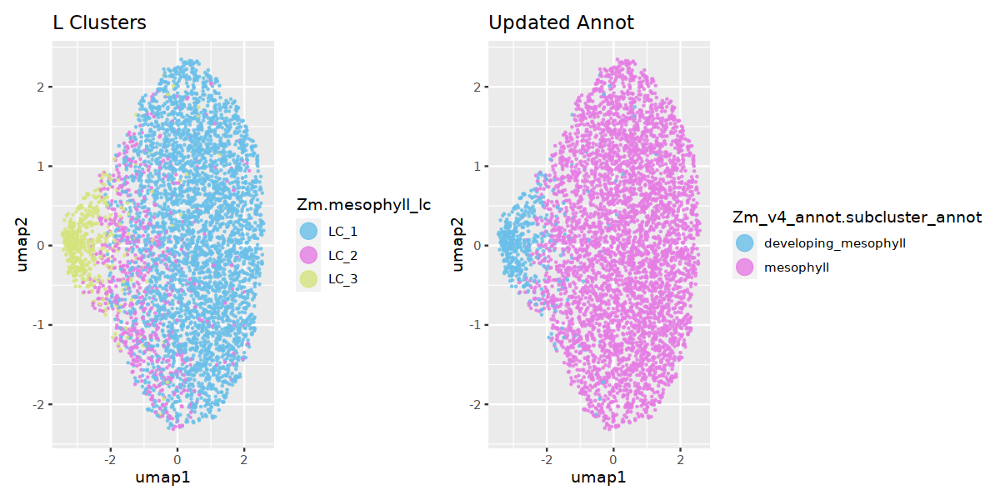

In [13]:
Zm.mesophyll_sub_annot <- Zm.subcluster_mesophyll.clean.clusters.counts$sub_cluster_mesophyll %>% 
    dplyr::mutate(Zm.mesophyll_lc = str_c("LC", LouvainClusters, sep = "_")) %>%     
    dplyr::mutate(Zm_v4_annot.subcluster_annot = NA)  %>% 
    dplyr::mutate(Zm_v4_annot.subcluster_annot = case_when(Zm.mesophyll_lc %in% c("LC_1") ~ "mesophyll",
        Zm.mesophyll_lc %in% c("LC_2") ~ "mesophyll",                                                                                                                    
        Zm.mesophyll_lc %in% c("LC_3") ~ "developing_mesophyll",                                                                                                                  
        TRUE ~ "unknown_clusters"))




options(repr.plot.width=10, repr.plot.height=5)
LC_vasc <- ggplot(Zm.mesophyll_sub_annot, aes(x=umap1, y = umap2, color = Zm.mesophyll_lc)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("L Clusters")

vasc_annot <- ggplot(Zm.mesophyll_sub_annot, aes(x=umap1, y = umap2, color = Zm_v4_annot.subcluster_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Annot")

LC_vasc + vasc_annot


Attaching package: 'patchwork'


The following object is masked from 'package:cowplot':

    align_plots


The following object is masked from 'package:MASS':

    area




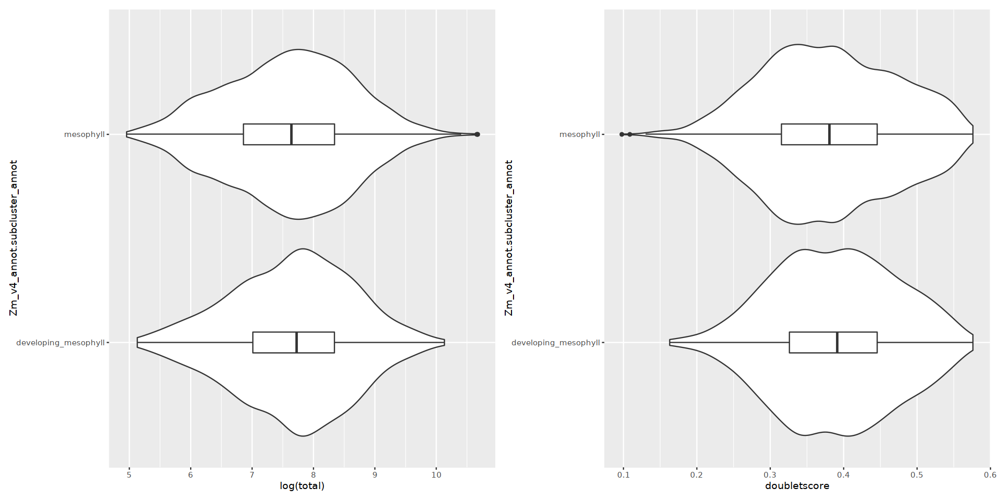

In [14]:
library(patchwork)
options(repr.plot.width=16, repr.plot.height=8)
total_tn5 <- ggplot(Zm.mesophyll_sub_annot, aes(x = Zm_v4_annot.subcluster_annot, y = log(total))) + 
    geom_violin() + 
    geom_boxplot(width = .1) +
      coord_flip()


doublet_score <- ggplot(Zm.mesophyll_sub_annot, aes(x = Zm_v4_annot.subcluster_annot, y = doubletscore)) + 
    geom_violin() + 
    geom_boxplot(width = .1) +
      coord_flip()


total_tn5 + doublet_score

Rows: 33379 Columns: 28
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (7): cellID, sampleID, d.type, Zm_v4_annot, Zm_v4_annot.subcluster_anno...
dbl (21): total, tss, acrs, ptmt, nSites, log10nSites, pTSS, FRiP, pOrg, tss...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm_v4_annot"                  "Zm_v4_annot.subcluster_annot"
[27] "Zm.vasculature_lc"            "Zm.epidermis_lc"

,cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,sampleID,umap1,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters,V3_final_annnotation,Zm.mesophyll_lc,Zm_v4_annot.subcluster_annot
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<fct>,<chr>,<chr>,<chr>
BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1,BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1,42628,5253,4894,16,23121,4.364007,0.1232289,0.1148072,0.0003753402,⋯,rep1,0.897289404,1.24235916,0.2065217,singlet,0.0003753402,1,NA,LC_1,mesophyll
BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1,BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1,33010,6359,7984,169,17408,4.240749,0.1926386,0.2418661,0.0051196607,⋯,rep1,-0.411717108,-0.90132827,0.3695652,singlet,0.0051196607,1,NA,LC_1,mesophyll
BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1,BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1,30442,3442,3355,123,15359,4.186363,0.1130675,0.1102096,0.0040404704,⋯,rep1,2.011339435,0.30251829,0.3913043,singlet,0.0040404704,1,NA,LC_1,mesophyll
BC:Z:GTGAAAATGTCAATACGATGAGCACTAA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAATGTCAATACGATGAGCACTAA-Zm_rep1_P4_10x.rep1,31746,15253,25287,123,13552,4.132003,0.4804700,0.7965413,0.0038745039,⋯,rep1,1.255435148,-0.73001629,0.3913043,singlet,0.0038745039,1,mesophyll,LC_1,mesophyll
BC:Z:GTTTCGGATCAGTAAGAGTGAAAACTAA-Zm_rep1_P6_10x.rep1,BC:Z:GTTTCGGATCAGTAAGAGTGAAAACTAA-Zm_rep1_P6_10x.rep1,29596,11915,19740,40,14073,4.148387,0.4025882,0.6669820,0.0013515340,⋯,rep1,-1.811282089,1.12934321,0.5217391,singlet,0.0013515340,2,NA,LC_2,mesophyll
BC:Z:CGTACGTAGCTTAAACAGTTTCGCGAGG-Zm_rep1_P7_10x.rep1,BC:Z:CGTACGTAGCTTAAACAGTTTCGCGAGG-Zm_rep1_P7_10x.rep1,25881,7350,11054,192,13352,4.125546,0.2839921,0.4271087,0.0074185696,⋯,rep1,-0.833097151,-0.65885693,0.3260870,singlet,0.0074185696,1,mesophyll,LC_1,mesophyll
BC:Z:GTGAAAAGTCAAATACGGTGGCCTTCCC-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAAGTCAAATACGGTGGCCTTCCC-Zm_rep1_P4_10x.rep1,24602,8894,12092,122,12595,4.100198,0.3615153,0.4915048,0.0049589464,⋯,rep1,-0.548425129,-0.87676185,0.4239130,singlet,0.0049589464,1,mesophyll,LC_1,mesophyll
BC:Z:GAGTGGAGTTCCAAACACGTACGACTAA-Zm_rep1_P8_10x.rep1,BC:Z:GAGTGGAGTTCCAAACACGTACGACTAA-Zm_rep1_P8_10x.rep1,25157,11348,18995,68,11935,4.076822,0.4510872,0.7550582,0.0027030250,⋯,rep1,-3.215491941,0.04497904,0.4347826,singlet,0.0027030250,3,developing_mesophyll,LC_3,developing_mesophyll
BC:Z:GTGAAAATGTCAGTCCTGTAGAGGATGA-Zm_rep1_P4_10x.rep1,BC:Z:GTGAAAATGTCAGTCCTGTAGAGGATGA-Zm_rep1_P4_10x.rep1,24134,9876,16041,77,11854,4.073865,0.4092152,0.6646640,0.0031905196,⋯,rep1,-1.122499397,0.63401549,0.2608696,singlet,0.0031905196,1,unknown,LC_1,mesophyll


'data.frame':	4848 obs. of  27 variables:
 $ cellID                      : chr  "BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1" "BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1" "BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1" "BC:Z:GTGAAAATGTCAATACGATGAGCACTAA-Zm_rep1_P4_10x.rep1" ...
 $ total                       : num  42628 33010 30442 31746 29596 ...
 $ tss                         : num  5253 6359 3442 15253 11915 ...
 $ acrs                        : num  4894 7984 3355 25287 19740 ...
 $ ptmt                        : num  16 169 123 123 40 192 122 68 77 176 ...
 $ nSites                      : num  23121 17408 15359 13552 14073 ...
 $ log10nSites                 : num  4.36 4.24 4.19 4.13 4.15 ...
 $ pTSS                        : num  0.123 0.193 0.113 0.48 0.403 ...
 $ FRiP                        : num  0.115 0.242 0.11 0.797 0.667 ...
 $ pOrg                        : num  0.000375 0.00512 0.00404 0.003875 0.001352 ...
 $ tss_z                       : num  

[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm_v4_annot"                  "Zm_v4_annot.subcluster_annot"
[27] "Zm.vasculature_lc"            "Zm.epidermis_lc"

cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,umap2,doubletscore,d.type,ptmt_ratio,LouvainClusters,Zm.vasculature_lc,Zm.epidermis_lc,Zm_v4_annot,Zm_v4_annot.subcluster_annot,Zm.mesophyll_lc
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>
BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1,42628,5253,4894,16,31496,4.498255,0.1232289,0.1148072,0.0003753402,⋯,-0.99038459,0.2065217,singlet,0.0003753402,3,NA,NA,mesophyll,mesophyll,LC_1
BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1,33010,6359,7984,169,23878,4.377998,0.1926386,0.2418661,0.0051196607,⋯,-1.71794630,0.3695652,singlet,0.0051196607,2,NA,NA,mesophyll,mesophyll,LC_1
BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1,30442,3442,3355,123,20217,4.305717,0.1130675,0.1102096,0.0040404704,⋯,-1.36846305,0.3913043,singlet,0.0040404704,2,NA,NA,mesophyll,mesophyll,LC_1
BC:Z:GTGAAAATGTCAATACGATGAGCACTAA-Zm_rep1_P4_10x.rep1,31746,15253,25287,123,19329,4.286209,0.4804700,0.7965413,0.0038745039,⋯,-1.80510594,0.3913043,singlet,0.0038745039,2,NA,NA,mesophyll,mesophyll,LC_1
BC:Z:GTTTCGGATCAGTAAGAGTGAAAACTAA-Zm_rep1_P6_10x.rep1,29596,11915,19740,40,19278,4.285062,0.4025882,0.6669820,0.0013515340,⋯,-0.19546772,0.5217391,singlet,0.0013515340,12,NA,NA,mesophyll,mesophyll,LC_2
BC:Z:CGTACGTAGCTTAAACAGTTTCGCGAGG-Zm_rep1_P7_10x.rep1,25881,7350,11054,192,18076,4.257102,0.2839921,0.4271087,0.0074185696,⋯,-1.43945790,0.3260870,singlet,0.0074185696,2,NA,NA,mesophyll,mesophyll,LC_1
BC:Z:GTGAAAAGTCAAATACGGTGGCCTTCCC-Zm_rep1_P4_10x.rep1,24602,8894,12092,122,17071,4.232259,0.3615153,0.4915048,0.0049589464,⋯,-1.86469222,0.4239130,singlet,0.0049589464,2,NA,NA,mesophyll,mesophyll,LC_1
BC:Z:GAGTGGAGTTCCAAACACGTACGACTAA-Zm_rep1_P8_10x.rep1,25157,11348,18995,68,16510,4.217747,0.4510872,0.7550582,0.0027030250,⋯,-0.23475350,0.4347826,singlet,0.0027030250,12,NA,NA,developing_mesophyll,developing_mesophyll,LC_3
BC:Z:GTGAAAATGTCAGTCCTGTAGAGGATGA-Zm_rep1_P4_10x.rep1,24134,9876,16041,77,16214,4.209890,0.4092152,0.6646640,0.0031905196,⋯,-0.69447161,0.2608696,singlet,0.0031905196,3,NA,NA,mesophyll,mesophyll,LC_1


[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm.vasculature_lc"            "Zm.epidermis_lc"             
[27] "Zm_v4_annot"                  "Zm_v4_annot.subcluster_annot"
[29] "Zm.mesophyll_lc"

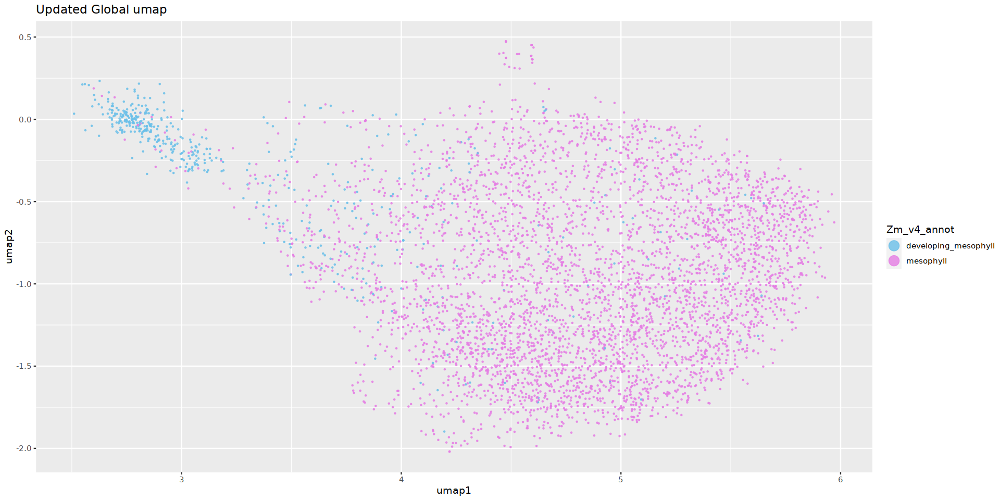

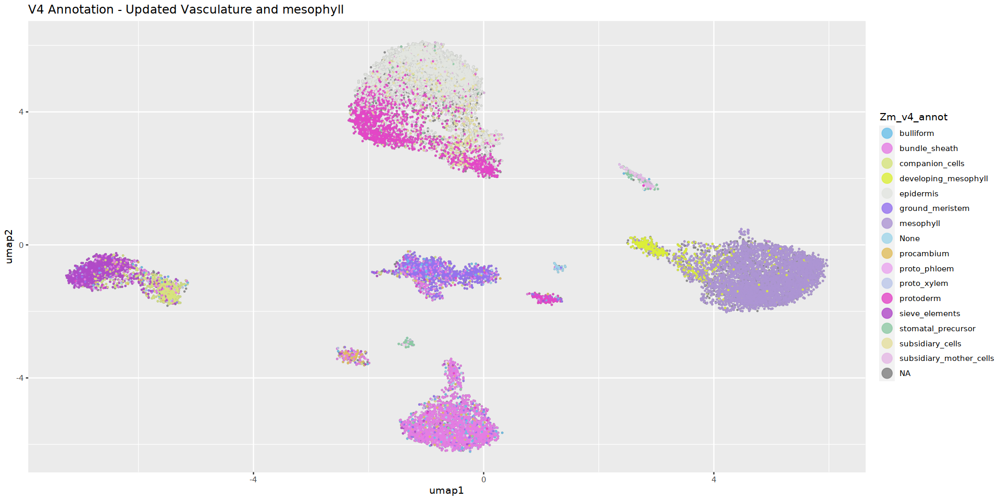

In [16]:
Zm.v4_annot.vasc <- read_delim("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.updated_epidermis.updated_vasculature_subclustering.txt")

colnames(Zm.v4_annot.vasc)

Zm.mesophyll_sub_annot
str(Zm.mesophyll_sub_annot)
Zm.subcluster_vasc_updated_annotations <- Zm.mesophyll_sub_annot  %>% 
    dplyr::mutate(Zm_v4_annot = Zm_v4_annot.subcluster_annot)  %>% 
    mutate(across(c(LouvainClusters),factor))  %>% 
    dplyr::select(cellID, Zm_v4_annot, Zm_v4_annot.subcluster_annot, Zm.mesophyll_lc)

colnames(Zm.v4_annot.vasc)

Zm.subcluster_mesophyll.final_meta <- Zm.v4_annot.vasc  %>% 
    dplyr::select(-Zm_v4_annot, -Zm_v4_annot.subcluster_annot)  %>% 
    dplyr::filter(cellID %in% Zm.mesophyll_sub_annot$cellID)  %>% 
    left_join(., Zm.subcluster_vasc_updated_annotations, by = "cellID")  %>% 
    mutate(across(c(LouvainClusters),factor))
    

Zm.subcluster_mesophyll.final_meta

colnames(Zm.subcluster_mesophyll.final_meta)

global_umap_only_mesophyll <- ggplot(Zm.subcluster_mesophyll.final_meta, aes(x=umap1, y = umap2, color = Zm_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("Updated Global umap")

global_umap_only_mesophyll

`%ni%` <- Negate(`%in%`)

v4_annot_filtered_cells <- Zm.v4_annot.vasc %>% 
    dplyr::filter(cellID %ni% Zm.subcluster_mesophyll.final_meta)  %>% 
      mutate(across(c(LouvainClusters),factor))


Zm.combined_vasc <- bind_rows(v4_annot_filtered_cells, Zm.subcluster_mesophyll.final_meta)

updated_meso_annot_global <- ggplot(Zm.combined_vasc, aes(x=umap1, y = umap2, color = Zm_v4_annot)) +
  scale_colour_manual(values=other)  + guides(colour = guide_legend(override.aes = list(size=5))) + 
 geom_point(size = .25, alpha = .8)+ ggtitle("V4 Annotation - Updated Vasculature and mesophyll")

updated_meso_annot_global

In [39]:
Zm.combined_vasc  %>% 
    dplyr::group_by(Zm_v4_annot.subcluster_annot, sampleID)  %>% 
    summarise(counts = n())

`summarise()` has grouped output by 'Zm_v4_annot.subcluster_annot'. You can override using the `.groups` argument.


Zm_v4_annot.subcluster_annot,sampleID,counts
<chr>,<chr>,<int>
bulliform,rep1,518
bulliform,rep2,93
bundle_sheath,rep1,1526
bundle_sheath,rep2,1070
companion_cells,rep1,449
companion_cells,rep2,252
developing_mesophyll,rep1,318
developing_mesophyll,rep2,174
epidermis,rep1,2085


In [35]:
Zm.combined_vasc  %>% 
    dplyr::group_by(cellID)  %>% 
    summarise(counts = n())  %>% 
    dplyr::filter(counts > 1)

cellID,counts
<chr>,<int>
BC:Z:ACTGATAGTCAAAAACAACTGATCGAGG-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACAACTGATGTTTC-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACAATGAGCCGCGT-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACACGTACGGTTTC-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACAGAGTGGCGCGT-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACAGGTAGCTGACC-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACAGTGGCCCGGTT-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACAGTGGCCGTTTC-Zm_rep1_P10_10x.rep1,2
BC:Z:ACTGATAGTCAAAAACAGTTTCGAACAT-Zm_rep1_P10_10x.rep1,2


In [17]:
colnames(Zm.mesophyll_sub_annot)

Zm.subcluster_mesophyll.clean.clusters.final$final_mesophyll_annotation <- Zm.mesophyll_sub_annot
Zm.subcluster_mesophyll.clean.clusters.final <- run_presto(Zm.subcluster_mesophyll.clean.clusters.final,
           meta_slot = "final_mesophyll_annotation",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot.subcluster_annot")



mesophyll_sub_annot.top_markers <- top_markers(Zm.subcluster_mesophyll.clean.clusters.final$presto_marker, 200)

mesophyll_v1.sub_marker_list <- list()
for (i in unique(Zm.subcluster_mesophyll.clean.clusters.final$final_mesophyll_annotation$Zm_v4_annot)) {
    
    make_set <- setNames("geneID",i) 
    markers_present_in_presto <- left_join(mesophyll_sub_annot.top_markers, 
                                           marker_list_maize, by = make_set)  %>% 
    dplyr::filter(is.na(chr) != TRUE)  %>% 
    dplyr::select(rank, i, chr:tissue) %>% 
    dplyr::rename("geneID" = i)
    
    mesophyll_v1.sub_marker_list[[i]] <- markers_present_in_presto
}
                 
mesophyll_v1.sub_marker_list

[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "V3_final_annnotation"         "Zm.mesophyll_lc"             
[27] "Zm_v4_annot.subcluster_annot"

# A tibble: 6 × 27
  cellID       total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg  tss_z
  <chr>        <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl> <dbl> <dbl>   <dbl>  <dbl>
1 BC:Z:GTCCGC… 42628  5253  4894    16  23121    4.36 0.123 0.115 3.75e-4 -0.674
2 BC:Z:GTGGCC… 33010  6359  7984   169  17408    4.24 0.193 0.242 5.12e-3 -0.440
3 BC:Z:CCGTCC… 30442  3442  3355   123  15359    4.19 0.113 0.110 4.04e-3 -0.708
4 BC:Z:GTGAAA… 31746 15253 25287   123  13552    4.13 0.480 0.797 3.87e-3  0.530
5 BC:Z:GTTTCG… 29596 11915 19740    40  14073    4.15 0.403 0.667 1.35e-3  0.268
6 BC:Z:CGTACG… 25881  7350 11054   192  13352    4.13 0.284 0.427 7.42e-3 -0.132
# … with 16 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>,
#   Zm.mesophyll_lc <chr>, Zm_v4_annot.subcluster_annot

rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
10,Zm00001eb158810,chr3,220987633,220994980,cah1,mesophyll,axillaryBud;leaf
96,Zm00001eb012270,chr1,40006278,40008645,denovo.ID.AM.12,"ground_meristem,mesophyll,undifferentiate_parenchyma",leaf
104,Zm00001eb195270,chr4,189546416,189552160,denovo.ID.AM.100,"xylem_parenchyma,companion_cell",leaf
163,Zm00001eb041120,chr1,216343268,216349212,ccr1,"bundle_sheath,vascular_sclerenchyma",axillaryBud;leaf;crownRoot;root;tassel;ear
177,Zm00001eb359190,chr8,150377960,150388567,cah6,mesophyll,axillaryBud;leaf
rank,geneID,chr,start,end,name,type,tissue
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
3,Zm00001eb084940,chr2,66223855,66236990,ba2,"axillary_meristem,branch_meristem,peripheral_zone_inflorescence_meristem,spikelet_pair_meristem,spikelet_meristem,upper_floral_meristem,lower_floral_meristem,pistil_primordia,stamen_primordia,provascular_strands,glume_primordia,lemma_primordia,palea_primordia",axillaryBud;leaf;tassel;ear
89,Zm00001eb026490,chr1,121465669,121469876,ZmLAX2,"procambial_meristem,root_tip_epidermis,root_tip_pericycle,root_tip_endodermis",axillaryBud;leaf;crownRoot;root;tassel;ear


In [45]:
Zm.subcluster_mesophyll.clean.clusters.final

   [[ suppressing 32 column names 'BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1', 'BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1', 'BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1' ... ]]

   [[ suppressing 32 column names 'BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1', 'BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1', 'BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1' ... ]]

   [[ suppressing 32 column names 'BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1', 'BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1', 'BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1' ... ]]

   [[ suppressing 32 column names 'BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1', 'BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1', 'BC:Z:CCGTCCTAGCTTCTAAGATTCCTTCGGA-Zm_rep1_P1_10x.rep1' ... ]]

   [[ suppressing 32 column names 'BC:Z:GTCCGCGGCTACATACGGTGAAACGAGG-Zm_rep1_P3_10x.rep1', 'BC:Z:GTGGCCCTTGTAATTCCACTGATACCGG-Zm_rep1_P5_10x.rep1', 'BC:

In [55]:
write_delim(Zm.subcluster_mesophyll.final_meta, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.mesophyll_subclustering.txt",
                       col_names = TRUE, quote = "none", delim = "\t")

# A tibble: 6 × 27
  cellID       total   tss  acrs  ptmt nSites log10…¹  pTSS  FRiP    pOrg  tss_z
  <chr>        <dbl> <dbl> <dbl> <dbl>  <dbl>   <dbl> <dbl> <dbl>   <dbl>  <dbl>
1 BC:Z:GTCCGC… 42628  5253  4894    16  23121    4.36 0.123 0.115 3.75e-4 -0.674
2 BC:Z:GTGGCC… 33010  6359  7984   169  17408    4.24 0.193 0.242 5.12e-3 -0.440
3 BC:Z:CCGTCC… 30442  3442  3355   123  15359    4.19 0.113 0.110 4.04e-3 -0.708
4 BC:Z:GTGAAA… 31746 15253 25287   123  13552    4.13 0.480 0.797 3.87e-3  0.530
5 BC:Z:GTTTCG… 29596 11915 19740    40  14073    4.15 0.403 0.667 1.35e-3  0.268
6 BC:Z:CGTACG… 25881  7350 11054   192  13352    4.13 0.284 0.427 7.42e-3 -0.132
# … with 16 more variables: acr_z <dbl>, sites_z <dbl>, qc_check <dbl>,
#   background <dbl>, cellbulk <dbl>, is_cell <dbl>, sampleID <chr>,
#   umap1 <dbl>, umap2 <dbl>, doubletscore <dbl>, d.type <chr>,
#   ptmt_ratio <dbl>, LouvainClusters <fct>, V3_final_annnotation <chr>,
#   Zm.mesophyll_lc <chr>, Zm_v4_annot.subcluster_annot

Rows: 22169188 Columns: 3
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr (2): gene_name, barcode
dbl (1): accessability

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
`summarise()` has grouped output by 'Zm_v4_annot.subcluster_annot'. You can override using the `.groups` argument.


# A tibble: 6 × 4
# Groups:   Zm_v4_annot.subcluster_annot [1]
  Zm_v4_annot.subcluster_annot geneID          counts value
  <chr>                        <chr>            <dbl> <dbl>
1 developing_mesophyll         Zm00001eb000010     18 22.9 
2 developing_mesophyll         Zm00001eb000020      8 10.2 
3 developing_mesophyll         Zm00001eb000060     21 26.8 
4 developing_mesophyll         Zm00001eb000080     21 26.8 
5 developing_mesophyll         Zm00001eb000100      4  5.10
6 developing_mesophyll         Zm00001eb000110      1  1.27



Attaching package: 'modelr'


The following object is masked from 'package:RcppML':

    mse


Selecting by resid


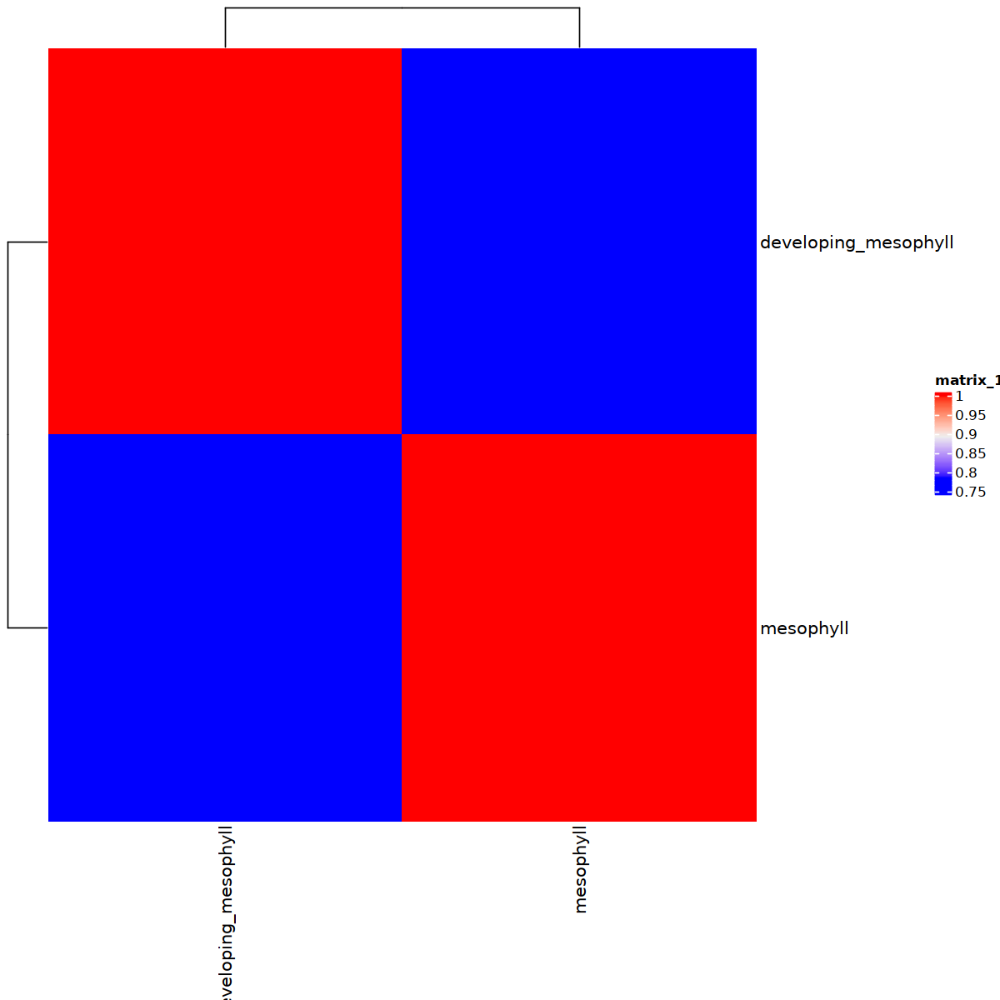

In [18]:
Zm.subcluster_mesophyll.clean.clusters.final <- marker_correlation(Zm.subcluster_mesophyll.clean.clusters.final,
           meta_slot = "final_mesophyll_annotation",
           counts_raw = "acr_counts_raw",
           cluster_name = "Zm_v4_annot.subcluster_annot")

library(modelr)
combined_louvain_clusters <- as_tibble(Zm.subcluster_mesophyll.clean.clusters.final$corr_matrix) %>%
    pivot_longer(!geneID, names_to = "cluster_name", values_to = "score")  %>% 
    group_by(geneID)  %>% 
      summarize(mean = mean(score),
            var = var(score))

regression <- loess(var ~ mean, data=combined_louvain_clusters)

combined_louvain_clusters.final <- combined_louvain_clusters %>% 
    add_residuals(regression)  %>% 
    arrange(resid, desc = FALSE)  %>% 
    top_n(800)

options(repr.plot.width=10, repr.plot.height=10)
corr_matrix <- Zm.subcluster_mesophyll.clean.clusters.final$corr_matrix

viz_matrix <- as_tibble(corr_matrix)  %>% 
    dplyr::filter(geneID %in% combined_louvain_clusters.final$geneID)  %>% 
    dplyr::select(-geneID)

Lc_corr_matrix <- cor(data.matrix(viz_matrix))

suppressPackageStartupMessages(library(ComplexHeatmap))
library(ComplexHeatmap)
Heatmap(Lc_corr_matrix)

In [124]:
`%ni%` <- Negate(`%in%`)

In [ ]:
#Final Annotation

In [134]:
colnames(vasculatre_epidermis)

[1] "cellID"                       "total"                       
 [3] "tss"                          "acrs"                        
 [5] "ptmt"                         "nSites"                      
 [7] "log10nSites"                  "pTSS"                        
 [9] "FRiP"                         "pOrg"                        
[11] "tss_z"                        "acr_z"                       
[13] "sites_z"                      "qc_check"                    
[15] "background"                   "cellbulk"                    
[17] "is_cell"                      "sampleID"                    
[19] "umap1"                        "umap2"                       
[21] "doubletscore"                 "d.type"                      
[23] "ptmt_ratio"                   "LouvainClusters"             
[25] "Zm_v4_annot"                  "Zm_v4_annot.subcluster_annot"
[27] "Zm.vasculature_lc"            "Zm.epidermis_lc"

In [136]:
# Combine all annotaiotns

vasculatre_epidermis <- read_delim("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.updated_epidermis.updated_vasculature_subclustering.txt")
vasculatre_epidermis.fitlered <- vasculatre_epidermis  %>% 
    dplyr::filter(is.na(Zm_v4_annot) != TRUE)  

dubs <- vasculatre_epidermis.fitlered %>%  
    group_by(cellID)  %>% 
    summarise(count = n())  %>% 
    dplyr::filter(count >1)

remove_some_doublets <- vasculatre_epidermis.fitlered  %>% 
    dplyr::filter(cellID %in% dubs$cellID)  %>% 
    arrange(cellID)  %>% 
    dplyr::select(-Zm.vasculature_lc, -Zm.epidermis_lc)  %>% 
    dplyr::filter(Zm_v4_annot != "bulliform")  %>% 
    unique()

final_removal <- remove_some_doublets  %>% 
    group_by(cellID)  %>% 
    summarise(count = n())  %>% 
    dplyr::filter(count >1)

final_selected_cells <- remove_some_doublets  %>% 
    dplyr::filter(cellID %ni% final_removal$cellID)  %>% 
    dplyr::filter(Zm_v4_annot != "bulliform")  %>% 
    unique()


vasculatre_epidermis.fitlered.2 <- vasculatre_epidermis.fitlered  %>% 
    dplyr::filter(cellID %ni% final_selected_cells$cellID)



mesophyll_subclustering <- read_delim("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.mesophyll_subclustering.txt")  %>% 
    dplyr::filter(cellID %ni% vasculatre_epidermis.fitlered$cellID)

final_combined_cells <- bind_rows(vasculatre_epidermis.fitlered.2, mesophyll_subclustering, final_selected_cells)  %>% 
    mutate(across(c(LouvainClusters),factor))

Rows: 33379 Columns: 28
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (7): cellID, sampleID, d.type, Zm_v4_annot, Zm_v4_annot.subcluster_anno...
dbl (21): total, tss, acrs, ptmt, nSites, log10nSites, pTSS, FRiP, pOrg, tss...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
Rows: 4901 Columns: 29
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (8): cellID, sampleID, d.type, Zm.vasculature_lc, Zm.epidermis_lc, Zm_v...
dbl (21): total, tss, acrs, ptmt, nSites, log10nSites, pTSS, FRiP, pOrg, tss...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show

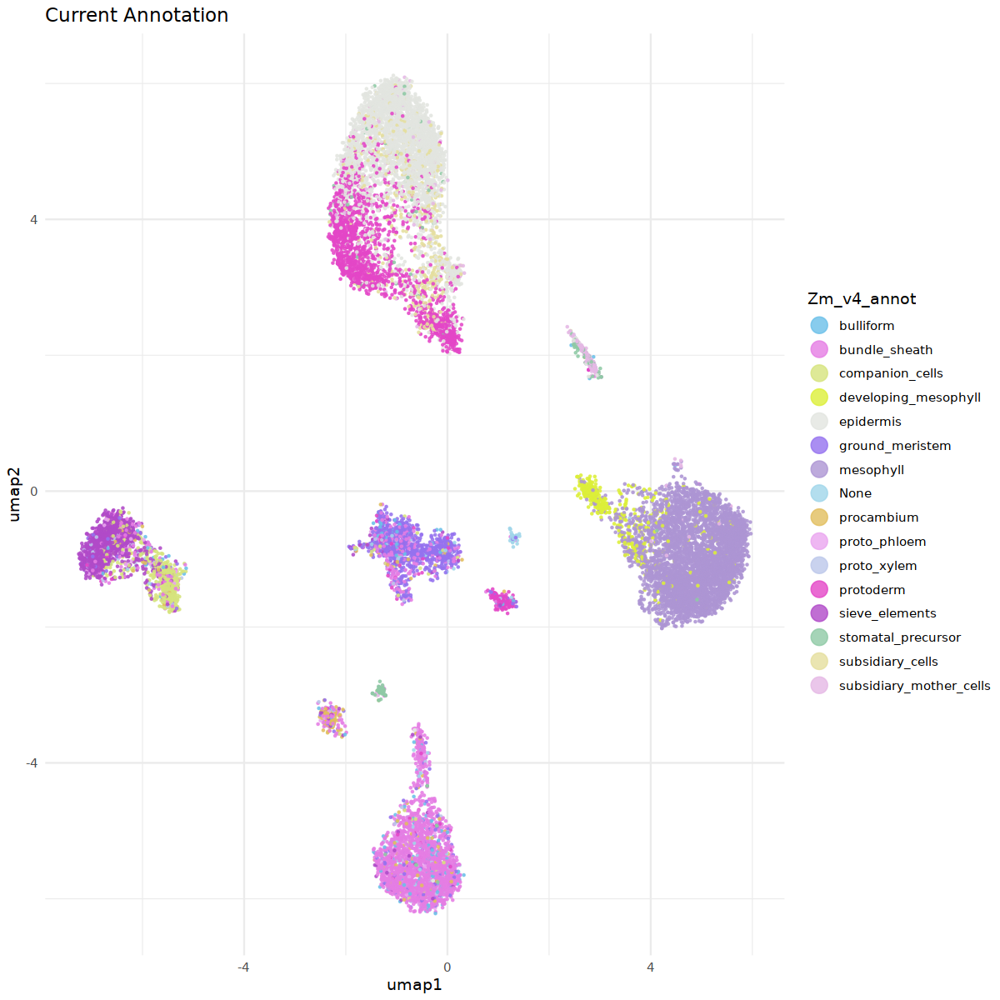

In [137]:
ggplot(final_combined_cells, aes(x=umap1, y = umap2, color = Zm_v4_annot)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Current Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))


In [145]:

remove_final_doublets <- final_combined_cells  %>% 
    group_by(cellID)  %>% 
    summarise(counts = n())  %>% 
    dplyr::filter(counts > 1)

final_combined_cells.fitlered <- final_combined_cells  %>% 
    dplyr::filter(cellID %ni% remove_final_doublets$cellID)

In [146]:
final_combined_cells.fitlered  %>% 
    group_by(cellID)  %>% 
    summarise(counts = n())  %>% 
    dplyr::filter(counts > 1)


cellID,counts
<chr>,<int>


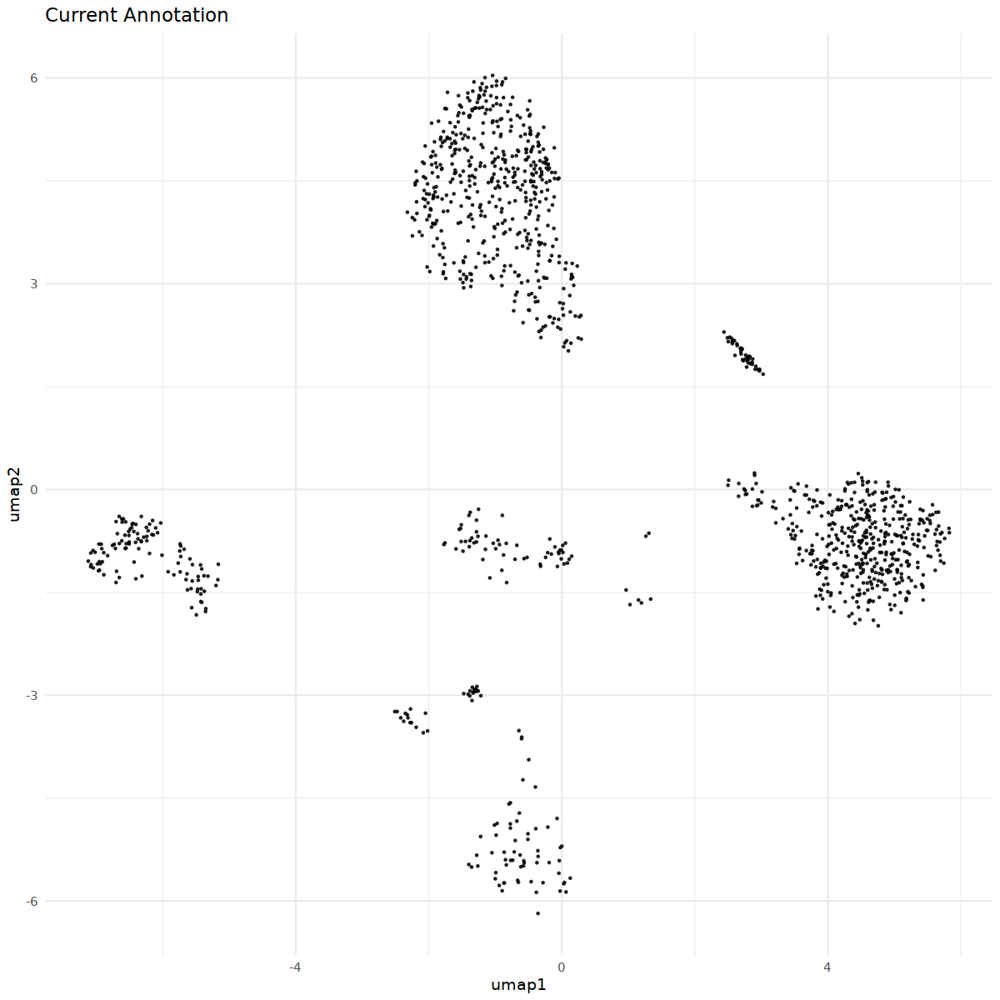

In [147]:
# Grab cells dropped in annotation of sub-clusters


un_annotated_cells <- loaded_socrates_data$Clusters  %>% 
    dplyr::filter(cellID %ni% final_combined_cells.fitlered$cellID)  %>% 
    mutate(across(c(LouvainClusters),factor))


ggplot(un_annotated_cells, aes(x=umap1, y = umap2)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Current Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))


In [148]:
all_cells_captured <- bind_rows(un_annotated_cells,final_combined_cells.fitlered)

In [149]:
all_cells_captured %>%  group_by(cellID)  %>% 
    summarise(counts = n())  %>% 
    dplyr::filter(counts > 1)


cellID,counts
<chr>,<int>


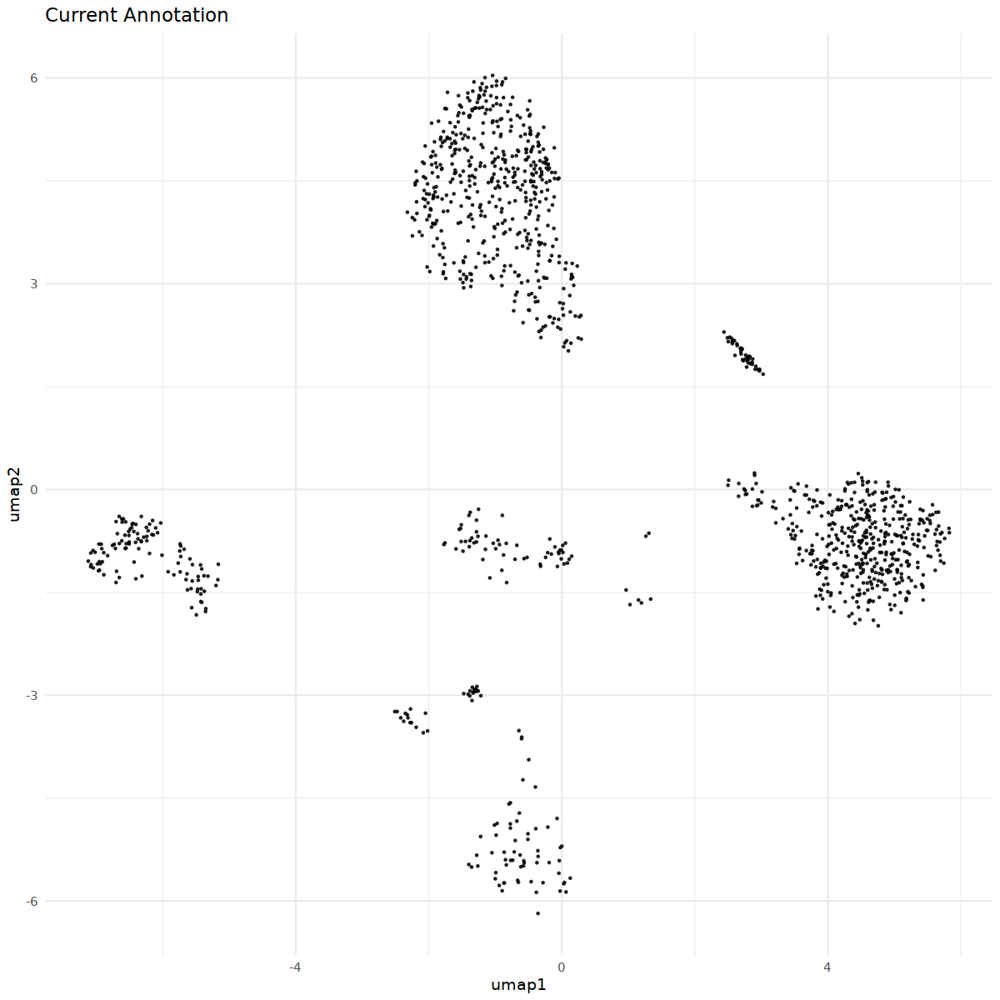

In [150]:
library("symphony")

nas_left <- all_cells_captured %>% 
  dplyr::filter(is.na(Zm_v4_annot) == TRUE) %>% 
  ggplot(., aes(x=umap1, y = umap2)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Current Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))

nas_left 

In [151]:
all_cells_captured %>%  
group_by(cellID)  %>% 
    summarise(count = n())  %>% 
    dplyr::filter(count >1)

cellID,count
<chr>,<int>


In [152]:
## Select down the cells to pull 
zm.v4.PCAs <- read.table("/scratch/jpm73279/comparative_single_cell/02.QC_clustering/zea_mays/clustering/Zm_leaf.updated_QC_2.annot.V4.SVD.full.reduced_dimensions.txt")

zm.na_annots <- all_cells_captured %>% 
    filter(is.na(Zm_v4_annot) == TRUE) 
zm.annot.v4 <- all_cells_captured %>% 
    filter(is.na(Zm_v4_annot) == FALSE) 

annotate_PCAs <- zm.v4.PCAs[zm.annot.v4$cellID,]
non_annotated_PCAs <- zm.v4.PCAs[zm.na_annots$cellID,]


knn_pred = class::knn(annotate_PCAs, non_annotated_PCAs, zm.annot.v4$Zm_v4_annot, k = 5, prob = TRUE)
knn_prob = attributes(knn_pred)$prob
zm.na_annots$Zm_v4_annot <- knn_pred


zm.v4.final_annot_meta <- bind_rows(zm.na_annots, zm.annot.v4)  %>% 
    dplyr::mutate(Zm_v4_annot = case_when(Zm_v4_annot == "bulliform" ~ "bundle_sheath",
                                         TRUE ~ Zm_v4_annot))

cluster_numbers <- zm.v4.final_annot_meta %>% 
  group_by(Zm_v4_annot) %>% 
  summarise(total_cell_count = n())


zm_v4_annot.cell_counts <- left_join(zm.v4.final_annot_meta, cluster_numbers, by = c("Zm_v4_annot")) %>% 
  mutate(v4_annotation_n = str_c(Zm_v4_annot, total_cell_count, sep = "_ncell_"))

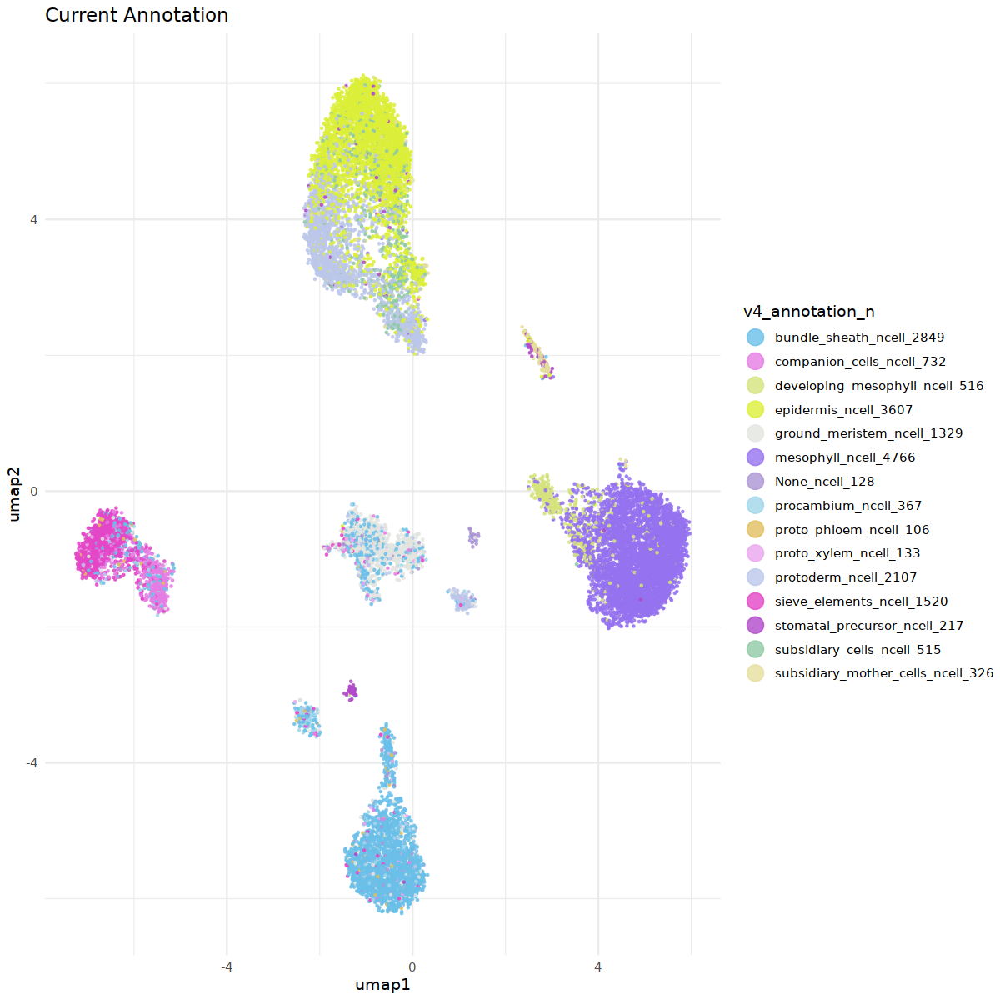

In [153]:
ggplot(zm_v4_annot.cell_counts, aes(x=umap1, y = umap2, color = v4_annotation_n)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Current Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))

In [154]:
write_delim(zm_v4_annot.cell_counts, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.txt",
                       col_names = TRUE, quote = "none", delim = "\t")

In [4]:
unique(zm.v4_annot$Zm_v4_annot)

[1] "epidermis"               "ground_meristem"        
 [3] "companion_cells"         "mesophyll"              
 [5] "sieve_elements"          "bundle_sheath"          
 [7] "None"                    "protoderm"              
 [9] "subsidiary_mother_cells" "proto_xylem"            
[11] "developing_mesophyll"    "procambium"             
[13] "stomatal_precursor"      "subsidiary_cells"       
[15] "proto_phloem"

In [17]:
# Updating Annotation 11/8/2022

library(tidyverse)
zm.v4_annot <- read_delim("/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.txt")
head(zm.v4_annot)


zm.v4_annot.updated <- zm.v4_annot  %>% 
    dplyr::mutate(Zm_v4_annot = case_when(Zm_v4_annot == "proto_xylem" ~ "bundle_sheath", 
                                         Zm_v4_annot == "proto_phloem" ~ "bundle_sheath", 
                                         Zm_v4_annot == "None" ~ "unknown",  
                                         TRUE ~ Zm_v4_annot ))  %>% 
    dplyr::select(-total_cell_count)



cluster_numbers <- zm.v4_annot.updated %>% 
  group_by(Zm_v4_annot) %>% 
  summarise(total_cell_count = n())

Rows: 19218 Columns: 31
── Column specification ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (9): cellID, sampleID, d.type, Zm_v4_annot, Zm_v4_annot.subcluster_anno...
dbl (22): total, tss, acrs, ptmt, nSites, log10nSites, pTSS, FRiP, pOrg, tss...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


cellID,total,tss,acrs,ptmt,nSites,log10nSites,pTSS,FRiP,pOrg,⋯,d.type,ptmt_ratio,LouvainClusters,Zm_v4_annot,Zm_v4_annot.subcluster_annot,Zm.vasculature_lc,Zm.epidermis_lc,Zm.mesophyll_lc,total_cell_count,v4_annotation_n
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
BC:Z:GTGGCCTAGCTTCTAAGACTGATACCGG-Zm_rep1_P5_10x.rep1,69259,11480,15110,627,49210,4.692053,0.1657546,0.21816659,0.009052975,⋯,singlet,0.009052975,1,epidermis,NA,NA,NA,NA,3607,epidermis_ncell_3607
BC:Z:GTGGCCCCGTCCTCGCGATTCCTGCTCC-Zm_rep1_P5_10x.rep1,35547,5909,4391,41,25495,4.406455,0.1662306,0.12352660,0.001153403,⋯,singlet,0.001153403,13,ground_meristem,NA,NA,NA,NA,1329,ground_meristem_ncell_1329
BC:Z:GTGGCCTAGCTTAGCGACAAAAGACTAA-Zm_rep1_P5_10x.rep1,32969,12514,18654,413,22195,4.346255,0.3795687,0.56580424,0.012526919,⋯,singlet,0.012526919,1,epidermis,NA,NA,NA,NA,3607,epidermis_ncell_3607
BC:Z:GTCCGCAGTCAACAATTGGTAGCTTCCC-Zm_rep1_P3_10x.rep1,18383,2409,1653,62,13762,4.138682,0.1310450,0.08992003,0.003372681,⋯,singlet,0.003372681,13,ground_meristem,NA,NA,NA,NA,1329,ground_meristem_ncell_1329
BC:Z:GTTTCGATGTCAGTATAGTTTCGTCGGA-Zm_rep1_P6_10x.rep1,18205,8453,13999,23,12146,4.084433,0.4643230,0.76896457,0.001263389,⋯,singlet,0.001263389,1,epidermis,NA,NA,NA,NA,3607,epidermis_ncell_3607
BC:Z:GTTTCGCTTGTACTAAGCGTACGAACAT-Zm_rep1_P6_10x.rep1,16732,6549,10696,51,11590,4.064083,0.3914057,0.63925412,0.003048052,⋯,singlet,0.003048052,1,epidermis,NA,NA,NA,NA,3607,epidermis_ncell_3607


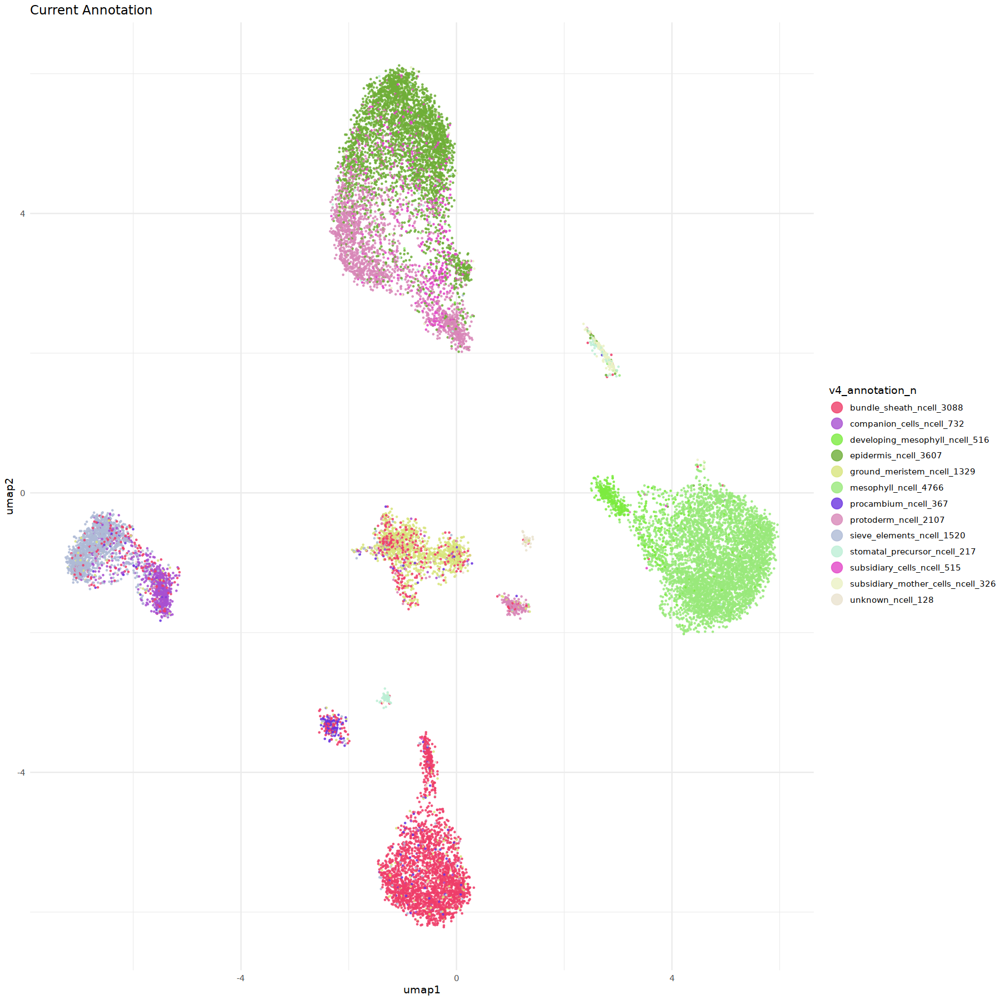

In [23]:
library(randomcoloR)
other <- randomcoloR::distinctColorPalette(k = 55)
other <- sample(other)

zm_v4_annot.cell_counts <- left_join(zm.v4_annot.updated, cluster_numbers, by = c("Zm_v4_annot")) %>% 
  mutate(v4_annotation_n = str_c(Zm_v4_annot, total_cell_count, sep = "_ncell_"))


ggplot(zm_v4_annot.cell_counts, aes(x=umap1, y = umap2, color = v4_annotation_n)) +
  scale_colour_manual(values=other)  + geom_point(size = .25, alpha = .8) + theme_minimal() + ggtitle("Current Annotation")  +
  guides(colour = guide_legend(override.aes = list(size=5)))

In [24]:
write_delim(zm_v4_annot.cell_counts, "/home/jpm73279/Mendieta_et_al_comparative_single_cell/metrics/annotations/Zm_annot_v4/Zm.leaf_annot.V4.meta.final.txt",
                       col_names = TRUE, quote = "none", delim = "\t")